In [1]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, RandomForestClassifier
from sklearn.model_selection import cross_val_score, train_test_split, StratifiedKFold, StratifiedShuffleSplit, KFold
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.svm import SVR, SVC
from sklearn.metrics import r2_score, accuracy_score, recall_score, confusion_matrix
from sklearn.decomposition import PCA
from sklearn.linear_model import ElasticNet, Lasso,  BayesianRidge, LassoLarsIC
from sklearn.kernel_ridge import KernelRidge
from sklearn.tree import DecisionTreeRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF,ConstantKernel as C
from matplotlib_venn import venn2
from lightgbm import LGBMRegressor
from sklearn.pipeline import make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.mixture import GaussianMixture
import json
import pickle
import xgboost as xgb

from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from hyperopt.pyll.base import scope
from hyperopt.pyll.stochastic import sample

import numpy as np
import pandas as pd
from scipy import stats
from scipy.spatial import distance as d
import copy

import seaborn as sns
from IPython.display import set_matplotlib_formats
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import matplotlib.patches as mpatches

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
set_matplotlib_formats('retina')
plt.rcParams['figure.dpi'] = 250
plt.rcParams.update({'font.size': 5})
sns.set_style('dark', {'legend.frameon':True})
np.random.seed(42)

# 1. Helper functions

In [47]:
def plotconfmat(clf, s_pred, y_train):
    clabel = [0, 1]
    sns.heatmap(confusion_matrix(s_pred, y_train, labels = clabel), xticklabels=clabel, yticklabels=clabel,
                annot=True, cbar = False, cmap="YlGnBu", fmt = 'g')
    plt.title('Confusion matrix of %s, accuracy: %.2f%%'%(clf, accuracy_score(s_pred, y_train)*100), fontsize = 10)
    plt.xlabel('Lab Measurement', fontsize = 10)
    plt.ylabel('Prediction', fontsize = 10)
    plt.show()
    
def plot_pred(s_pred, y_val2, term, mse):
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, figsize=(6,4.5))

    sns.scatterplot(y = np.expm1(s_pred), x = np.expm1(y_val2), ax=ax1)
    g = sns.lineplot(x = [0,100], y = [0,100], color = 'red', ax = ax1)
    g.lines[0].set_linestyle(':')
    ax1.set_title('Lab Measurement and Predictions of %s'%term)
    ax1.set_xlabel('Lab Measurement, C6plus, Mole%')
    ax1.set_ylabel('Predictions, C6plus, Mole%')
    ax1.grid()

    std_list = [1, 3, 5]
    cols = ['green', 'orange', 'red']
    errors = np.expm1(y_val2) - np.expm1(s_pred)

    sns.barplot(x = list(range(len(s_pred))), y = errors, linewidth = 0, color = 'black', ax=ax2)
    for i in range(len(std_list)):
        ax2.hlines(y = std_list[i], xmin = 0, xmax = len(s_pred), linestyles= '--', colors=cols[i], linewidth = 0.5)
        ax2.hlines(y = -std_list[i], xmin = 0, xmax = len(s_pred), linestyles= '--', colors=cols[i], linewidth = 0.5, label='%d%%'%std_list[i])
    _step = 50
    ticks = np.concatenate((np.arange(1, _step, _step-1), np.arange(_step, len(s_pred), _step)))
    ax2.set_xticks(ticks-1)
    ax2.set_xticklabels(ticks)
    ax2.set_title('Difference between Lab Measurement and Predictions of %s'%term)
    ax2.set_xlabel('Data points')
    ax2.set_ylabel('Lab C6plus - Predictioin, Mole%')
    ax2.legend()
    ax2.grid()

    stat_list = [sum(np.abs(errors) <= i) for i in range(1, 6)]
    stat_list.extend([sum(np.abs(errors) <= 10), sum(np.abs(errors) <= 15), sum(np.abs(errors) <= 20), sum(np.abs(errors) > 20)])
    xlabels = ['<= %s%%'%str(i+1) for i in range(5)]
    xlabels.extend(['<= 10%', '<= 15%', '<= 20%', '> 20%'])
    g = sns.barplot(x = list(range(len(stat_list))), y = stat_list, ax = ax3, palette = sns.color_palette('Oranges_d', len(stat_list))[::-1])
    for p in g.patches:
        g.annotate("%d\n%d%%" % (int(p.get_height()), int(p.get_height())*100/len(errors)), (p.get_x() + p.get_width() / 2., p.get_height()*0.2), ha='center', va='center', weight = 'bold', xytext=(0, 20), textcoords='offset points')
    ax3.set_ylabel('Frequency')
    ax3.set_xlabel('Errors')
    ax3.set_xticklabels(xlabels)
    ticks2 = np.arange(0, len(errors), 50)
    ax3.tick_params(axis='both', which='both', length=0)
    ax3.set_title('Summary of Errors, MSE = %.4f'%mse)
    ax3.grid()

    sns.scatterplot(y = np.expm1(y_val2) - np.expm1(s_pred), x = np.expm1(y_val2), ax=ax4)
    g = sns.lineplot(x = [min(np.expm1(y_val2)),max(np.expm1(y_val2))], y = [0,0], color = 'red', ax = ax4)
    g.lines[0].set_linestyle(':')
    ax4.set_title('C6+ and Errors')
    ax4.set_ylabel('Errors, Lab Measurement - Prediction')
    ax4.set_xlabel('Lab Measurement, C6+')
    ax4.grid()

    plt.tight_layout()
    plt.show()

def plot_pred2(s_pred, y_val2, term, mse, lim):
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, figsize=(6,4.5))

    sns.scatterplot(y = np.expm1(s_pred), x = np.expm1(y_val2), ax=ax1)
    g = sns.lineplot(x = [0,lim], y = [0,lim], color = 'red', ax = ax1)
    g.lines[0].set_linestyle(':')
    ax1.set_title('Lab Measurement and Predictions of %s'%term)
    ax1.set_xlabel('Lab Measurement, GOR')
    ax1.set_ylabel('Predictions, GOR')
#     ax1.set_xlim([0, lim])
#     ax1.set_ylim([0, lim])
    ax1.grid()

    std_list = [1, 3, 5]
    cols = ['green', 'orange', 'red']
    errors = np.expm1(y_val2) - np.expm1(s_pred)

    sns.barplot(x = list(range(len(s_pred))), y = errors, linewidth = 0, color = 'black', ax=ax2)
    for i in range(len(std_list)):
        ax2.hlines(y = std_list[i]*100, xmin = 0, xmax = len(s_pred), linestyles= '--', colors=cols[i], linewidth = 0.5)
        ax2.hlines(y = -std_list[i]*100, xmin = 0, xmax = len(s_pred), linestyles= '--', colors=cols[i], linewidth = 0.5, label='%d'%(std_list[i]*100))
    _step = 100
    ticks = np.concatenate((np.arange(1, _step, _step-1), np.arange(_step, len(s_pred), _step)))
    ax2.set_xticks(ticks-1)
    ax2.set_xticklabels(ticks)
    ax2.set_title('Difference between Lab Measurement and Predictions of %s'%term)
    ax2.set_xlabel('Data points')
    ax2.set_ylabel('Lab GOR - Predictioin')
    ax2.legend()
    ax2.grid()
    
    mul = 100
    step_list = [1,2,3,4,5,10,15,20,20]
    stat_list = [sum(np.abs(errors) <= i*mul) for i in step_list[:-1]]
    stat_list.append(sum(np.abs(errors) > step_list[-1]*mul))
#     xlabels = ['<= %sE3'%str(i+1) for i in range(5)]
#     xlabels.extend(['<= 1E4', '<= 1.5E4', '<= 2E4', '> 2E4'])
    xlabels = ['<= '+str(i*mul) for i in step_list[:-1]]
    xlabels.append('> '+str(step_list[-1]*mul))
    g = sns.barplot(x = list(range(len(stat_list))), y = stat_list, ax = ax4, palette = sns.color_palette('Oranges_d', len(stat_list))[::-1])
    for p in g.patches:
        g.annotate("%d\n%d%%" % (int(p.get_height()), int(p.get_height())*100/len(errors)), (p.get_x() + p.get_width() / 2., p.get_height()*0.2), ha='center', va='center', weight = 'bold', xytext=(0, 20), textcoords='offset points')
    ax4.set_ylabel('Frequency')
    ax4.set_xlabel('Errors, Lab Measurement - Prediction')
    ax4.set_xticklabels(xlabels)
#     ax4 = ax3.twinx()
    ticks2 = np.arange(0, len(errors), 50)
#     ax3.set_yticks(np.linspace(0, 300, 6))
    ax4.tick_params(axis='both', which='both', length=0)
    ax4.set_title('Summary of Errors, MSE = %.4f'%mse)
    ax4.grid()
    
    ax3errors = np.expm1(y_val2) - np.expm1(s_pred)
    sns.scatterplot(y = ax3errors, x = np.expm1(y_val2), ax=ax3)
    g = sns.lineplot(x = [min(np.expm1(y_val2)),max(np.expm1(y_val2))], y = [0,0], color = 'red', ax = ax3)
    g.lines[0].set_linestyle(':')
#     ax3.set_xlim([0, lim])
#     ax3.set_ylim([min(max(ax3errors), -lim), max(min(ax3errors), lim)])
#     ax3.set_ylim([-5000, 5000])
    ax3.set_title('GOR and Errors')
    ax3.set_ylabel('Errors, Lab Measurement - Prediction')
    ax3.set_xlabel('Lab Measurement, GOR')
    ax3.grid()

    plt.tight_layout()
    plt.show()
    
def plot_trials(trials):
    l = (np.array([i['result']['loss'] for i in trials])**2).tolist()
    l2 = (np.array([i['result']['test'] for i in trials])**2).tolist()
    sns.lineplot(x = list(range(len(l))), y = l, label = 'Training Error')#, linewidth = 0.1)
    sns.lineplot(x = list(range(len(l))), y = l2, label = 'Test Error')#, linewidth = 0.1)
    plt.plot([l.index(min(l)), l.index(min(l))], [min(l2), max(l)], color = 'green', ls= '--', label = 'Minimum Training')
    plt.plot([l2.index(min(l2)), l2.index(min(l2))], [min(l2), max(l)], color = 'black', ls= '--', label = 'Minimum Test')
    plt.xlabel('Iterations of Optimization', fontsize = 15)
    plt.ylabel('Mean Squared Error', fontsize = 15)
    plt.title('Training and Test Error of Bayesian Optimization', fontsize = 15)
    plt.grid()
    plt.legend()
def plot_min_dist(n_trials):
    d = [min([i['result']['test'] for i in trials[1]]) for trials in n_trials]
    sns.distplot(d)
    return d

# Featear engineering functions
def feat_eng(total_x):
    total_x = total_x.div(total_x.sum(axis = 1), axis = 0)*100
    total_x['Wh'] = total_x[['C2_mol', 'C3_mol', 'C4_mol', 'C5_mol']].sum(axis = 1)*100 / total_x[['C1_mol', 'C2_mol', 'C3_mol', 'C4_mol', 'C5_mol']].sum(axis = 1)
    total_x['Bh'] = (total_x['C1_mol'] + total_x['C2_mol']) / (total_x['C3_mol'] + total_x['C4_mol'] + total_x['C5_mol'])
    total_x['Ch'] = (total_x['C4_mol'] + total_x['C5_mol']) / total_x['C3_mol']
    
#     total_x['LH'] = 100*(total_x['C1_mol'] + total_x['C2_mol']) / (total_x['C4_mol'] + total_x['C5_mol'])**3
#     total_x['LM'] = 10 * total_x['C1_mol'] / (total_x['C3_mol'] + total_x['C2_mol'])**2
#     total_x['HM'] = (total_x['C4_mol'] + total_x['C5_mol'])**2/total_x['C3_mol']
    return total_x

def myclustering(total_x_r, total_y):
    clusters = 2
    gmm = make_pipeline(StandardScaler(), GaussianMixture(n_components=clusters, random_state=0))
    _c_data = np.column_stack((total_x_r.C1_mol, total_y['C6plus_mol'].values.reshape(-1,1)))
    labels = gmm.fit(_c_data).predict(_c_data)
    return labels

# 2. Tuning Class

In [4]:
class StackingAveragedModels(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self, base_models, meta_model, n_folds=5):
        self.base_models = base_models
        self.meta_model = meta_model
        self.n_folds = n_folds
   
    # We again fit the data on clones of the original models
    def fit(self, X, y):
        self.base_models_ = [list() for x in self.base_models]
        self.meta_model_ = clone(self.meta_model)
        kfold = KFold(n_splits=self.n_folds, shuffle=True, random_state=156)
        
        # Train cloned base models then create out-of-fold predictions
        # that are needed to train the cloned meta-model
        out_of_fold_predictions = np.zeros((X.shape[0], len(self.base_models)))
        for i, model in enumerate(self.base_models):
            for train_index, holdout_index in kfold.split(X, y):
                instance = clone(model)
                self.base_models_[i].append(instance)
                instance.fit(X[train_index], y[train_index])
                y_pred = instance.predict(X[holdout_index])
                out_of_fold_predictions[holdout_index, i] = y_pred
                
        # Now train the cloned  meta-model using the out-of-fold predictions as new feature
        self.meta_model_.fit(out_of_fold_predictions, y)
        return self
   
    #Do the predictions of all base models on the test data and use the averaged predictions as 
    #meta-features for the final prediction which is done by the meta-model
    def predict(self, X):
        meta_features = np.column_stack([
            np.column_stack([model.predict(X) for model in base_models]).mean(axis=1)
            for base_models in self.base_models_ ])
        return self.meta_model_.predict(meta_features)
    
class BaseModels(object):
    def __init__(self, mod, x_train, y_train, x_test, y_test, CV_fold, params = None):
#         params['random_state'] = 42
        self.params = params
        self.model = mod
        self.best = +np.inf
        self.x_train = x_train.astype(float)
        self.y_train = y_train.astype(float)
        self.x_test = x_test.astype(float)
        self.y_test = y_test.astype(float)
        self.fold = CV_fold
#         self.train_ind = train_ind
        if (mod == SVR )|(mod == KernelRidge)|(mod == GaussianProcessRegressor)|(mod == Lasso):
            self.nx_train, self.norm1 = self.normfunc(self.x_train)
            self.ny_train, self.norm2 = self.normfunc(self.y_train)[0].ravel(), self.normfunc(self.y_train)[1]
            self.nx_test = self.norm1.transform(self.x_test)
            self.ny_test = self.norm2.transform(self.y_test)
        self.y_pred = None
        self.train_pred = None
    
    def hyperopt_train_test(self, params):
        mod = copy.deepcopy(self.model)     
        if (mod == GaussianProcessRegressor):           
            params['kernel'] = RBF(length_scale=params['length'])
            params.pop('length')
        mod = mod(**params)

        if (mod == Lasso):# | (mod == SVR) | (mod == KernelRidge)| (mod == GaussianProcessRegressor):
            x, y, x_test = self.nx_train, self.ny_train, self.nx_test
        else:
            x, y, x_test = self.x_train, self.y_train.values.ravel(), self.x_test
#         return 1 - accuracy_score(mod.fit(self.x_train, self.y_train.values.ravel()).predict(self.x_test), self.y_test)
        return np.sqrt(-(cross_val_score(mod, x, y, scoring = 'neg_mean_squared_error', cv = self.fold))).mean()#, np.sqrt(mean_squared_error(mod.fit(x, y).predict(x_test), self.y_test))

    def f(self, params):
        acc1 = self.hyperopt_train_test(params)
        if acc1 < self.best:
            self.best= acc1
#         print('New best is', self.best, params)
        return {'loss': acc1,  'status': STATUS_OK}
    
    def tuning(self, par_space, iterations):
        trials = Trials()
        best = fmin(self.f, space = par_space, algo = tpe.suggest, max_evals = iterations, trials = trials, verbose = 0)
#         print( best)
        return trials.argmin, trials.best_trial['result']['loss'], trials.trials
    
    def normfunc(self, data):
        norm = StandardScaler()
        return norm.fit_transform(data), norm
    
    def tuningSVR(self, iterations):
        k_list = ['rbf']
        par_spa = {
            'C': hp.uniform('C', 0, 1000),
            'kernel': hp.choice('kernel', k_list),
            'gamma': hp.uniform('gamma', 0, 1000),
            'epsilon': hp.uniform('epsilon', 0, 1)
        }
        bp, bp_loss, trials = self.tuning(par_spa, iterations)
        bp['kernel'] = k_list[bp['kernel']]
        return bp, bp_loss, trials
    
    def tuningRF(self, iterations):
        clist = ['mse', 'mae']
        jlist = [-1]
        space = {
        'max_depth': scope.int(hp.quniform('max_depth', 1,20,1)),
        'max_features': scope.int(hp.quniform('max_features', 1,self.x_train.shape[1],1)),
        'n_estimators': scope.int(hp.quniform('n_estimators', 10,3000,10)),
        'criterion': hp.choice('criterion', clist),
        'random_state': hp.choice('random_state', [42]),
        'n_jobs': hp.choice('n_jobs', jlist)
        }
        bp, bp_loss, trials= self.tuning(space, iterations)

        for i in ['max_depth', 'max_features', 'n_estimators']:
            bp[i] = int(bp[i])

        bp['criterion'] = clist[bp['criterion']]
        bp['random_state'] = 42
        bp['n_jobs'] = -1
        return bp, bp_loss, trials
    
    def tuningLGB(self, iterations):
        type_list = ['gbdt', 'goss', 'dart']
        metric_list = ['rmsle']

        space = {
        'max_depth': scope.int(hp.uniform('max_depth', 1, 10)),
        'n_estimators': scope.int(hp.quniform('n_estimators', 10,1000, 10)),
        'boosting_type': hp.choice('boosting_type', type_list),
        'metric': hp.choice('metric', metric_list),
        'num_leaves': scope.int(hp.uniform('num_leaves', 2, 100)),
        'learning_rate': hp.loguniform('learning_rate', np.log(0.01), np.log(0.2)),
        'subsample_for_bin': scope.int(hp.quniform('subsample_for_bin', 20000, 300000, 20000)),
#         'subsample_for_bin': scope.int(hp.quniform('subsample_for_bin', 2000, 30000, 2000)),
        'min_child_samples': scope.int(hp.quniform('min_child_samples', 20, 500, 5)),
 
        'reg_alpha': hp.uniform('reg_alpha', 0.0, 1.0),
        'reg_lambda': hp.uniform('reg_lambda', 0.0, 1.0),
        'colsample_bytree': hp.uniform('colsample_bytree', 0.6, 1.0)
        }

        bp, bp_loss, trials = self.tuning(space, iterations)
    
        for i in ['n_estimators', 'num_leaves', 'max_depth', 'subsample_for_bin', 'min_child_samples']:
            bp[i] = int(bp[i])

        bp['boosting_type'] = type_list[bp['boosting_type']]
        bp['metric'] = metric_list[bp['metric']]
        return bp, bp_loss, trials
    
    def myNorm_prediction(self, params):
        mod = copy.deepcopy(self.model)
#         print(mod)
        if (mod == GaussianProcessRegressor) and ('length' in params.keys()):           
            params['kernel'] = RBF(length_scale=params['length'])
            params.pop('length')
        svr = mod(**params).fit(self.nx_train, self.ny_train)
        # on test data
        pred = svr.predict(self.nx_test)
        y_pred = self.norm2.inverse_transform(pred)
        # on trainning data
        pred2 = svr.predict(self.nx_train)
        y_pred_train = self.norm2.inverse_transform(pred2)
    
        return y_pred, y_pred_train, svr, mean_squared_error(pred, self.ny_test)
    
#     def myRF_prediction(self, params):
#         mod = copy.deepcopy(self.model)
#         RF = mod(**params).fit(self.x_train, self.y_train.values.ravel())
#         # on test data
#         y_pred = RF.predict(self.x_test)
#         # on trainning data
#         y_pred2 = RF.predict(self.x_train)

#         return y_pred, y_pred2, RF, mean_squared_error(y_pred, self.y_test.values.ravel())
    
#     def myLGB_prediction(self, params):
#         mod = copy.deepcopy(self.model)
#         mylgb = mod(**params).fit(self.x_train, self.y_train.values.ravel())
#         # on test data
#         y_pred = mylgb.predict(self.x_test)
#         # on trainning data
#         y_pred2 = mylgb.predict(self.x_train)

#         return y_pred, y_pred2, mylgb, mean_squared_error(y_pred, self.y_test.values.ravel())
    
    def pred_results(self, params, mod_name, title, _range, s_dir = None, ind1 = None, ind2 = None, exp = None):
        if self.model == SVR:
            self.y_pred, self.train_pred, mod1, _ = self.mySVR_prediction(params=params)
        elif self.model == RandomForestRegressor:
            self.y_pred, self.train_pred, mod1, _ = self.myRF_prediction(params = params)
        elif self.model == LGBMRegressor:
            self.y_pred, self.train_pred, mod1, _ = self.myLGB_prediction(params = params)
        self.y_pred = self.y_pred.clip(min=0)
        
        if exp == True:
            y1, y2, y3, y4 = np.exp(self.y_train), np.exp(self.y_test), np.exp(self.train_pred), np.expm1(self.y_pred)
        else:
             y1, y2, y3, y4 = self.y_train, self.y_test, self.train_pred, self.y_pred
                
#         o1_res1, o1_res2 = 
        plotresults(self.x_train, self.x_test, y1, y2, y3, y4, _range, mod_name, title, s_dir, ind1, ind2)
#         res_dist(o1_res1, o1_res2)
        
#         l_list = np.concatenate((np.arange(1,5.5,0.5), np.arange(6, 11, 1), np.array([10])))
        l_list = [200, 500, 500]

        summary_l = []
        thre_l = []
        percentage = []
        for i in l_list[:-1]:
            thre_l.append('<= '+str(i)+' Psi')
            num = sum(np.abs(y4 - y2.values.ravel()) <= i)
            summary_l.append(num)
            percentage.append(str(np.round((num/len(self.y_pred))*100, 2)) + '%')
        thre_l.append('>= '+str(l_list[-1])+' Psi')
        thre_l.append('Total')
        num2 = sum(np.abs(y4 - y2.values.ravel()) > l_list[-1])
        summary_l.append(num2)
        summary_l.append(len(self.y_pred))
        percentage.append(str(np.round((num2/len(self.y_pred)*100),2)) + '%')
        percentage.append('100%')

        df = pd.DataFrame({'Count':summary_l, 'Percentage':percentage, 'Threshold': thre_l})
        df = df.set_index('Threshold').rename_axis(None)
        display(df.T)
#         return o1_res1, o1_res2, self.train_pred, self.y_pred, df.T, mod1
        return y3, y4, df.T, mod1

class BaseModelsClf(object):
    def __init__(self, mod, x_train, y_train, x_test, y_test, CV_fold, params = None):
#         params['random_state'] = 42
        self.params = params
        self.model = mod
        self.best = +np.inf
        self.x_train = x_train.astype(float)
        self.y_train = y_train.astype(float)
        self.x_test = x_test.astype(float)
        self.y_test = y_test.astype(float)
        self.fold = CV_fold
#         self.train_ind = train_ind
        if (mod == SVR )|(mod == KernelRidge)|(mod == GaussianProcessRegressor)|(mod == Lasso):
            self.nx_train, self.norm1 = self.normfunc(self.x_train)
            self.ny_train, self.norm2 = self.normfunc(self.y_train)[0].ravel(), self.normfunc(self.y_train)[1]
            self.nx_test = self.norm1.transform(self.x_test)
            self.ny_test = self.norm2.transform(self.y_test)
        self.y_pred = None
        self.train_pred = None
    
    def hyperopt_train_test(self, params):
        mod = copy.deepcopy(self.model)     
        if (mod == GaussianProcessRegressor):           
            params['kernel'] = RBF(length_scale=params['length'])
            params.pop('length')
        mod = mod(**params)

        if (mod == Lasso):# | (mod == SVR) | (mod == KernelRidge)| (mod == GaussianProcessRegressor):
            x, y, x_test = self.nx_train, self.ny_train, self.nx_test
        else:
            x, y, x_test = self.x_train, self.y_train.values.ravel(), self.x_test
        return 1 - accuracy_score(mod.fit(self.x_train, self.y_train.values.ravel()).predict(self.x_test), self.y_test)
#         return np.sqrt(-(cross_val_score(mod, x, y, scoring = 'neg_mean_squared_error', cv = self.fold))).mean()#, np.sqrt(mean_squared_error(mod.fit(x, y).predict(x_test), self.y_test))

    def f(self, params):
        acc1 = self.hyperopt_train_test(params)
        if acc1 < self.best:
            self.best= acc1
#         print('New best is', self.best, params)
        return {'loss': acc1,  'status': STATUS_OK}
    
    def tuning(self, par_space, iterations):
        trials = Trials()
        best = fmin(self.f, space = par_space, algo = tpe.suggest, max_evals = iterations, trials = trials, verbose = 0)
#         print( best)
        return trials.argmin, trials.best_trial['result']['loss'], trials.trials
    
    def normfunc(self, data):
        norm = StandardScaler()
        return norm.fit_transform(data), norm
    
    def tuningSVR(self, iterations):
        k_list = ['rbf']
        par_spa = {
            'C': hp.uniform('C', 0, 1000),
            'kernel': hp.choice('kernel', k_list),
            'gamma': hp.uniform('gamma', 0, 1000),
            'epsilon': hp.uniform('epsilon', 0, 1)
        }
        bp, bp_loss, trials = self.tuning(par_spa, iterations)
        bp['kernel'] = k_list[bp['kernel']]
        return bp, bp_loss, trials

# 3. Datasets

## Training data

In [5]:
fn = 'C:/YujianWu/Data/AMG/103111289_(original)_Extended dBase_processed_mol.csv'

training_features = pd.read_csv(fn)

# training_features = training_features[(training_features.H2S_mol == 0)|(training_features.H2S_mol.isnull())].reset_index(drop = True)
# # training_features = training_features[~training_features.Fluid_Type.isnull()]

total_x = training_features[['C1_mol', 'C2_mol', 'C3_mol', 'C4_mol', 'C5_mol']]
total_x = total_x.fillna(0)
total_y = copy.copy(training_features[['C6plus_mol', 'GOR_scf_stb']])

# Feature engineering
total_x_r = feat_eng(total_x)
# The first clustering
total_y['Labels'] = myclustering(total_x_r, total_y).ravel().astype(int)
# Arbituary standard
total_y.loc[total_y.C6plus_mol<18,'Labels'] = 0

# The second clustering
total_y['Labels2'] = np.zeros((total_y.shape[0], 1)).astype(int)
total_x_r2 = total_x_r[total_y['Labels'] == 1]
total_y2 = copy.copy(total_y[total_y['Labels'] == 1])
total_y.loc[total_y.Labels == 1, 'Labels2'] = myclustering(total_x_r2, total_y2).ravel().astype(int)+1

# Renaming the labels
total_y['Type'] = np.zeros((total_y.shape[0], 1)).astype(int)
total_y.loc[total_y.Labels2==0, 'Type'] = 'GC'
total_y.loc[total_y.Labels2==1, 'Type'] = 'BO1'
total_y.loc[total_y.Labels2==2, 'Type'] = 'BO2'

total_y['Type2'] = np.zeros((total_y.shape[0], 1)).astype(int)
total_y.loc[total_y.Labels==0, 'Type2'] = 'GC'
total_y.loc[total_y.Labels==1, 'Type2'] = 'Oil'

total_y['New_label'] = np.zeros((total_y.shape[0], 1)).astype(int)
total_y.loc[(total_y.Labels2==0)|(total_y.Labels2==2), 'New_label'] = 1

In [6]:
# Split
# data_ind = total_y.GOR_scf_stb < 10000
# total_x_r = total_x_r[data_ind]
# total_y = total_y[data_ind]

X_train, X_val, y_train, y_val = train_test_split(total_x_r, total_y, test_size = 0.2, random_state = 6265)
X_train, X_val = np.log1p(X_train), np.log1p(X_val)

#Separate C6+ and GOR
# y_train_label, y_val_label = y_train['Labels'], y_val['Labels']
y_trainC6, y_valC6, y_train_GOR, y_val_GOR = y_train['C6plus_mol'], y_val['C6plus_mol'], y_train['GOR_scf_stb'], y_val['GOR_scf_stb']
y_trainC6_log, y_valC6_log, y_train_GOR_log, y_val_GOR_log = np.log1p(y_trainC6), np.log1p(y_valC6), np.log1p(y_train_GOR), np.log1p(y_val_GOR)

####

## Test data

In [8]:
# fn2 = 'C:/YujianWu/Data/AMG/NewTestcase - Copy.csv'
fn2 = 'C:/YujianWu/Data/AMG/NewTestcase_5samples.csv'

test_features = pd.read_csv(fn2)
# test_x = test_features.iloc[:,0:5].astype(float)
# test_x.columns = [i[:3]+'mol' for i in test_x.columns]
# test_x = test_x.fillna(0)

# test_y = test_features['C6plus_percntmol']

X_test = np.log1p(feat_eng(test_features[['C1_mol', 'C2_mol', 'C3_mol', 'C4_mol', 'C5_mol']]))
X_test = X_test.dropna()
X_test

,C1_mol,C2_mol,C3_mol,C4_mol,C5_mol,Wh,Bh,Ch
0,4.314818,2.624669,2.116256,1.568616,1.193922,3.303217,2.009915,0.607380
1,4.293195,2.639057,2.163323,1.667707,1.335001,3.360375,1.910543,0.653407
2,4.252335,2.252187,2.371151,2.152646,1.775783,3.457286,1.504077,0.827966
3,4.282206,2.230014,2.292535,2.079442,1.686399,3.387774,1.594549,0.824570
4,4.197653,2.622492,2.374906,2.175887,1.637053,3.568687,1.527858,0.800045


In [9]:
# fn2 = 'C:/YujianWu/Data/AMG/NewTestcase - Copy.csv'
fn2 = 'C:/YujianWu/Data/AMG/NewTestcase - 85PVTsamples.csv'

test_features2 = pd.read_csv(fn2)

X_test2 = np.log1p(feat_eng(test_features2[['C1_mol', 'C2_mol', 'C3_mol', 'C4_mol', 'C5_mol']]))
Y_test2_labels = test_features2.Fluid_Type

# 6. Workflow: renormalized C1~C5 to C6+ to GOR

## $Choose\ a\ model,\ C1/C6\ or\ C1\ and\ C6$

In [ ]:
with open('C:/YujianWu/Data/AMG/20190425C1C5toC6toGOR/RenormC1RawC6Ratio_500.pickle', 'rb') as f:
    s_bp2 = pickle.load(f)

In [ ]:
# Tuning C1/C6
# C6s2 = BaseModels(SVR, pd.DataFrame(new_xtrain2), pd.DataFrame(y_train_g2), pd.DataFrame(new_xval2), pd.DataFrame(y_val_g2), 5)
# s_bp2, _, _ = C6s2.tuningSVR(500)
# # Prediction
svr = make_pipeline(RobustScaler(), SVR(**s_bp2))
s_pred = svr.fit(pd.DataFrame(new_xtrain2), (y_train_g2)).predict(pd.DataFrame(new_xval2))
# Validation
s_mse = mean_squared_error(s_pred, y_val_g2)
plot_pred2(s_pred, y_val_g2, 'SVR', s_mse)

In [ ]:
with open('C:/YujianWu/Data/AMG/20190425C1C5toC6toGOR/RenormC1RawC6Ratio_500.pickle', 'wb') as f:
    pickle.dump(s_bp2, f)

In [ ]:
with open('C:/YujianWu/Data/AMG/20190425C1C5toC6toGOR/RenormC1RawC6Separately_200.pickle', 'rb') as f:
    s_bp3 = pickle.load(f)

In [ ]:
#Tuning C1 and C6
# C6s3 = BaseModels(SVR, pd.DataFrame(new_xtrain3), pd.DataFrame(y_train_g2), pd.DataFrame(new_xval3), pd.DataFrame(y_val_g2), 5)
# s_bp3, _, _ = C6s3.tuningSVR(200)
# Prediction
svr = make_pipeline(RobustScaler(), SVR(**s_bp3))
s_pred3 = svr.fit(pd.DataFrame(new_xtrain3), (y_train_g2)).predict(pd.DataFrame(new_xval3))
# Validation
s_mse3 = mean_squared_error(s_pred3, y_val_g2)
plot_pred2(s_pred3, y_val_g2, 'SVR', s_mse3)

In [ ]:
with open('C:/YujianWu/Data/AMG/20190425C1C5toC6toGOR/RenormC1RawC6Separately_200.pickle', 'wb') as f:
    pickle.dump(s_bp3, f)

## $Predicting\ C6+,\ RF$

In [167]:
rf_par = {'criterion': 'mae',
 'max_depth': 10,
 'max_features': 4,
 'n_estimators': 360,
 'n_jobs': -1,
 'random_state': 42}

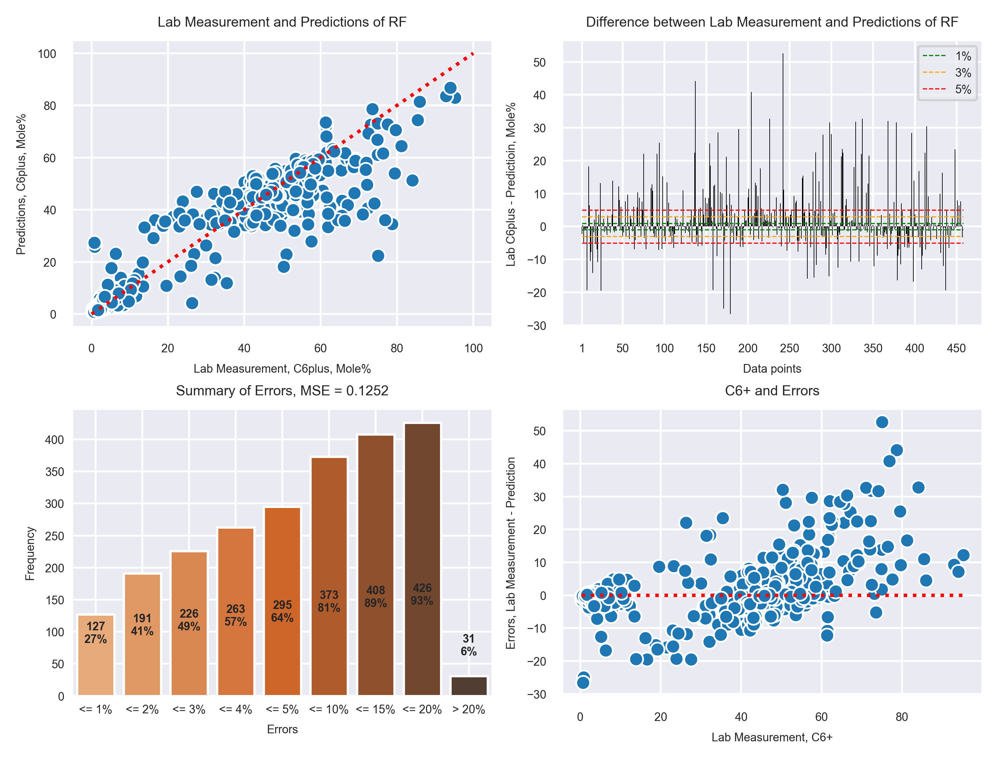

In [168]:
rf = RandomForestRegressor(**rf_par)
rf_pred_C6 = rf.fit(pd.DataFrame(X_train), (y_trainC6_log)).predict(pd.DataFrame(X_val))
plot_pred(rf_pred_C6, y_valC6_log, 'RF', mean_squared_error(rf_pred_C6, y_valC6_log))

# lgb = LGBMRegressor(**l_bp)
# lgb_pred_C6 = lgb.fit(pd.DataFrame(X_train2), (y_train2)).predict(pd.DataFrame(X_val2))

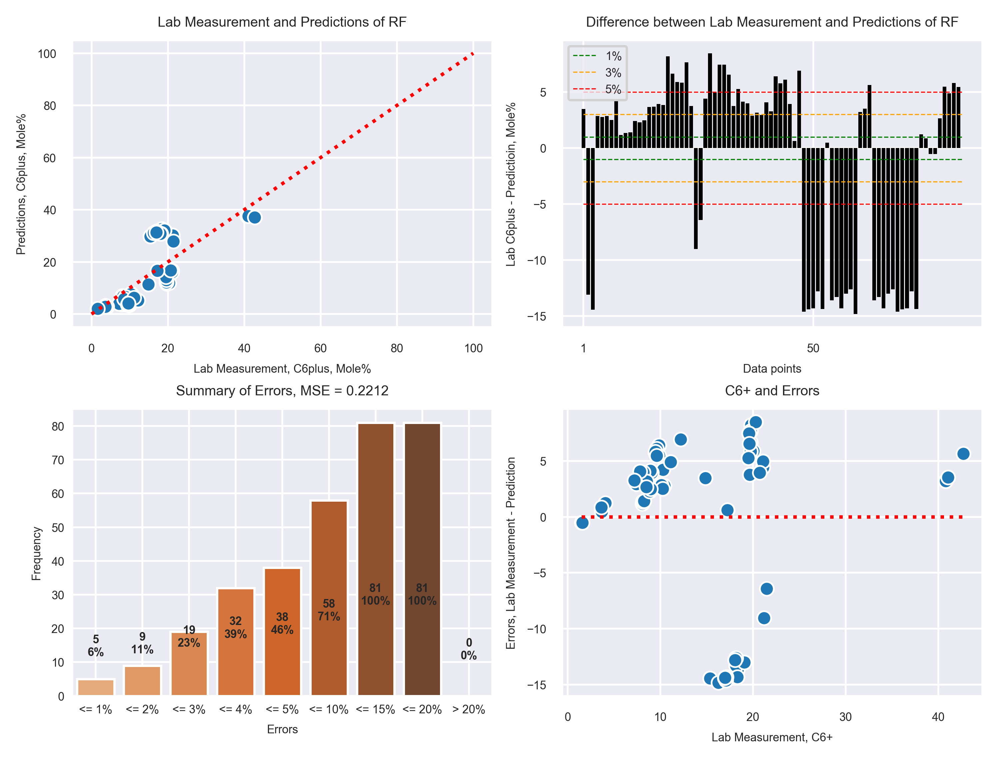

In [169]:
rf = RandomForestRegressor(**rf_par)
rf_pred_C6 = rf.fit(pd.DataFrame(X_train), (y_trainC6_log)).predict(pd.DataFrame(X_test2))
plot_pred(rf_pred_C6, np.log1p(test_features2.C6plus_mol), 'RF', mean_squared_error(rf_pred_C6, np.log1p(test_features2.C6plus_mol)))

# lgb = LGBMRegressor(**l_bp)
# lgb_pred_C6 = lgb.fit(pd.DataFrame(X_train2), (y_train2)).predict(pd.DataFrame(X_val2))

In [ ]:
rf_pred_C6_train = rf.fit(pd.DataFrame(X_train2), (y_train2)).predict(pd.DataFrame(X_train2))
lgb_pred_C6_train = lgb.fit(pd.DataFrame(X_train2), (y_train2)).predict(pd.DataFrame(X_train2))

## $Renormalized\ C1\ and\ predicted\ C6+\ for\ GOR\ prediction$

In [ ]:
new_xval4 = pd.DataFrame({
    'C1 mole': new_xval3['C1_mol'].values.ravel(), 
    'C6+ Predicted': rf_pred_C6.ravel()
})

In [ ]:
svr = make_pipeline(RobustScaler(), SVR(**s_bp3))
s_pred4 = svr.fit(pd.DataFrame(new_xtrain3), (y_train_g2)).predict(pd.DataFrame(new_xval4))
# Validation
s_mse4 = mean_squared_error(s_pred4, y_val_g2)
plot_pred2(s_pred4, y_val_g2, 'SVR', s_mse4)

#### GPR

In [ ]:
# data with label 1, optimization
gpr_t = BaseModels(SVR, x_tr1, pd.DataFrame(y_tr1), x_va1, pd.DataFrame(y_va1), 5)
# g_par = {
#     'length': hp.uniform('length', 1e-10, 100),
#     'alpha': hp.uniform('alpha', 0,100)
#         }
g_bp, _, _ = gpr_t.tuningSVR(1000)
# g_bp['kernel'] = RBF(length_scale=g_bp['length'])
# g_bp.pop('length', None)

In [ ]:
# gpr1 = make_pipeline(RobustScaler(), SVR(**g_bp1))
# g_pred1 = gpr1.fit(x_tr1, y_tr1).predict(x_va1)
# plot_pred(g_pred1, y_va1, 'GPR', mean_squared_error(g_pred1, y_va1))

In [26]:
g_bp1 = {'alpha': 0.03675197648117656, 'kernel': RBF(length_scale=15.4)}

In [ ]:
# # data with label 0, optimization
# gpr_t = BaseModels(GaussianProcessRegressor, x_tr0, pd.DataFrame(y_tr0), x_va0, pd.DataFrame(y_va0), 5)
# g_par = {
#     'length': hp.uniform('length', 1e-10, 100),
#     'alpha': hp.uniform('alpha', 0,100)
#         }
# g_bp, _, _ = gpr_t.tuning(g_par, 300)
# g_bp['kernel'] = RBF(length_scale=g_bp['length'])
# g_bp.pop('length', None)

In [80]:
x_tr0.head()

,C1_mol,C2_mol,C3_mol,C4_mol,C5_mol,Wh,Bh,Ch
1175,4.491709,1.986531,1.241167,1.027541,0.780265,2.543654,2.912148,0.793004
1282,4.535952,1.768445,0.952314,0.607235,0.335671,2.161904,3.566333,0.574034
1359,4.536405,1.765942,0.948324,0.605472,0.325595,2.157031,3.576140,0.570732
1348,4.440961,2.262527,1.594257,1.225017,0.791778,2.841622,2.585451,0.652438
1395,4.535287,1.786245,0.966435,0.566773,0.330447,2.169022,3.581742,0.535733


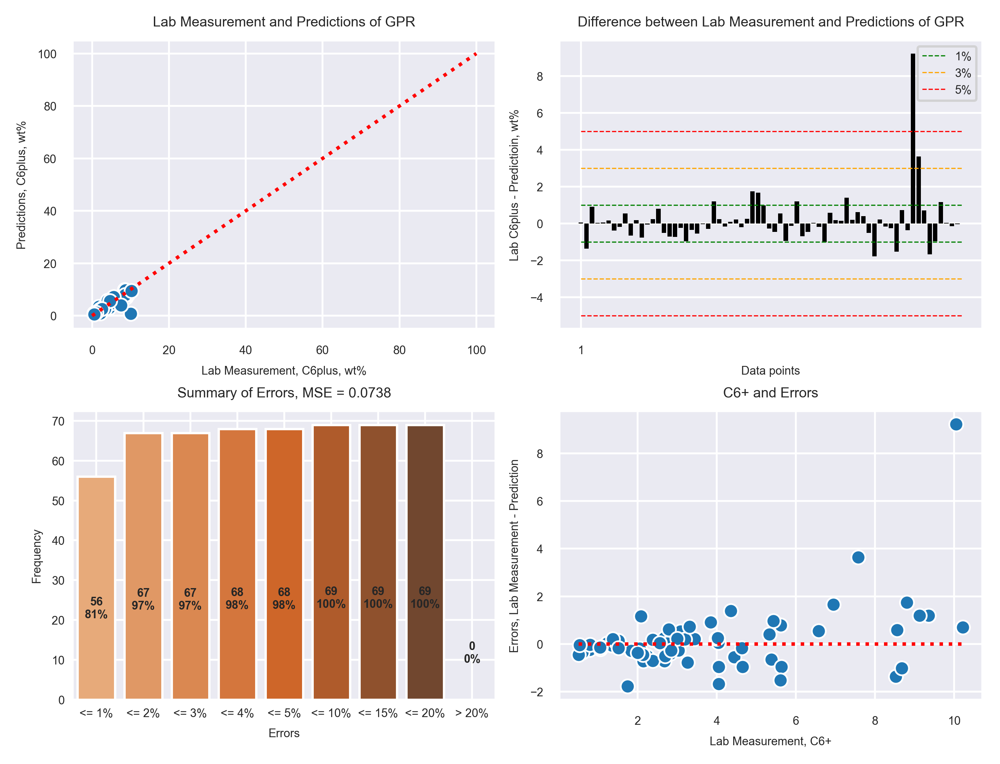

In [83]:
g_bp0 = {'alpha': 0.03699093946940535, 'kernel': RBF(length_scale=81.2)}

gpr0 = make_pipeline(RobustScaler(), GaussianProcessRegressor(**g_bp0))
g_pred0 = gpr0.fit(x_tr0, np.log1p(y_tr0.C6plus_mol)).predict(x_va0)
plot_pred(g_pred0, np.log1p(y_va0.C6plus_mol), 'GPR', mean_squared_error(g_pred0, np.log1p(y_va0.C6plus_mol)))

In [82]:
np.expm1(gpr0.predict(np.log1p(nx_test2)))

array([0.08022602])

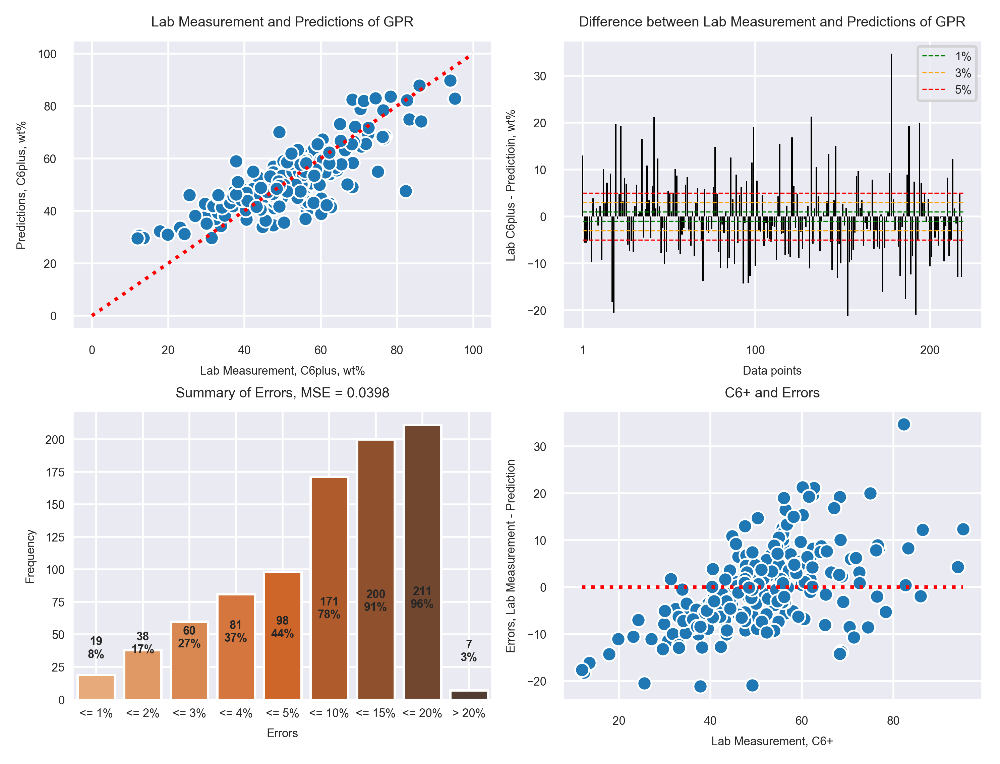

In [30]:
gpr1 = make_pipeline(RobustScaler(), GaussianProcessRegressor(**g_bp1))
g_pred1 = gpr1.fit(x_tr1, np.log1p(y_tr1.C6plus_mol)).predict(x_va1)
plot_pred(g_pred1, np.log1p(y_va1.C6plus_mol), 'GPR', mean_squared_error(g_pred1, np.log1p(y_va1.C6plus_mol)))

# gpr0 = make_pipeline(RobustScaler(), GaussianProcessRegressor(**g_bp0))
# g_pred0 = gpr0.fit(x_tr0, y_tr0).predict(x_tr0)
# plot_pred(g_pred0, y_tr0, 'GPR', mean_squared_error(g_pred0, y_tr0))

# gpr0 = make_pipeline(RobustScaler(), GaussianProcessRegressor(**g_bp0))
# g_pred0 = gpr0.fit(x_tr0, y_tr0).predict(x_va0)
# plot_pred(g_pred0, y_va0, 'GPR', mean_squared_error(g_pred0, y_va0))

# gpr0 = make_pipeline(RobustScaler(), GaussianProcessRegressor(**g_bp0))
# g_pred0_2 = gpr0.fit(x_tr0, y_tr0).predict(X_test)
# # plot_pred(g_pred0, y_va0, 'GPR', mean_squared_error(g_pred0, y_va0))

#### SVR

In [21]:
# # Cluster1, subcluster1
# y = np.log1p(y_tr1[(y_tr1.Labels == 1)&(y_tr1.Labels2 == 1)].C6plus_mol)
# x = x_tr1[(y_tr1.Labels == 1)&(y_tr1.Labels2 == 1)]

# gpr_t = BaseModels(SVR, x, pd.DataFrame(y), x, pd.DataFrame(y), 5)
# # g_par = {
# #     'length': hp.uniform('length', 1e-10, 100),
# #     'alpha': hp.uniform('alpha', 0,100)
# #         }
# g_bp1, _, _ = gpr_t.tuningSVR(500)
# # g_bp1['kernel'] = RBF(length_scale=g_bp1['length'])
# g_bp1['kernel'] = 'rbf'
# # g_bp1.pop('length', None)

# gpr1 = make_pipeline(RobustScaler(), SVR(**g_bp1))
# g_pred1 = gpr1.fit(x, y).predict(x)
# plot_pred(g_pred1, y, 'GPR', mean_squared_error(g_pred1, y))

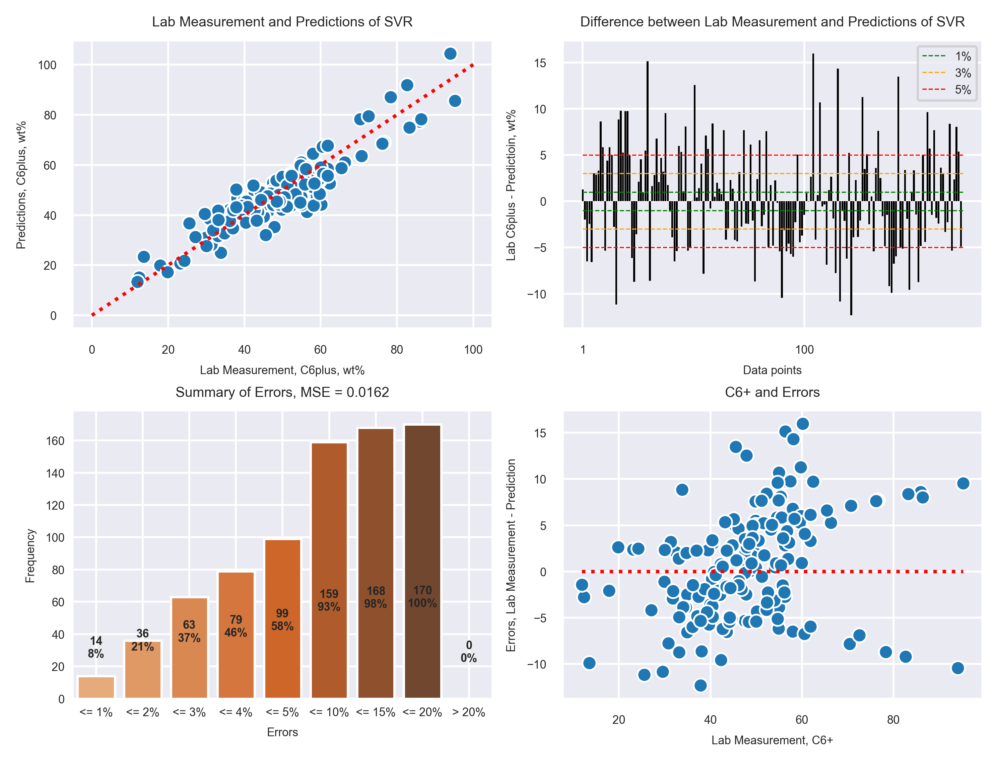

In [22]:
s_bp1 = {'C': 206.01687063420073,
 'epsilon': 0.1042631533140673,
 'gamma': 0.028570819580189782,
 'kernel': 'rbf'}
# Cluster1, subcluster1, validation
y = np.log1p(y_va1[(y_va1.Labels == 1)&(y_va1.Labels2 == 1)].C6plus_mol)
x = x_va1[(y_va1.Labels == 1)&(y_va1.Labels2 == 1)]

gpr1 = make_pipeline(RobustScaler(), SVR(**s_bp1))
g_pred1 = gpr1.fit(x, y).predict(x)
plot_pred(g_pred1, y, 'SVR', mean_squared_error(g_pred1, y))

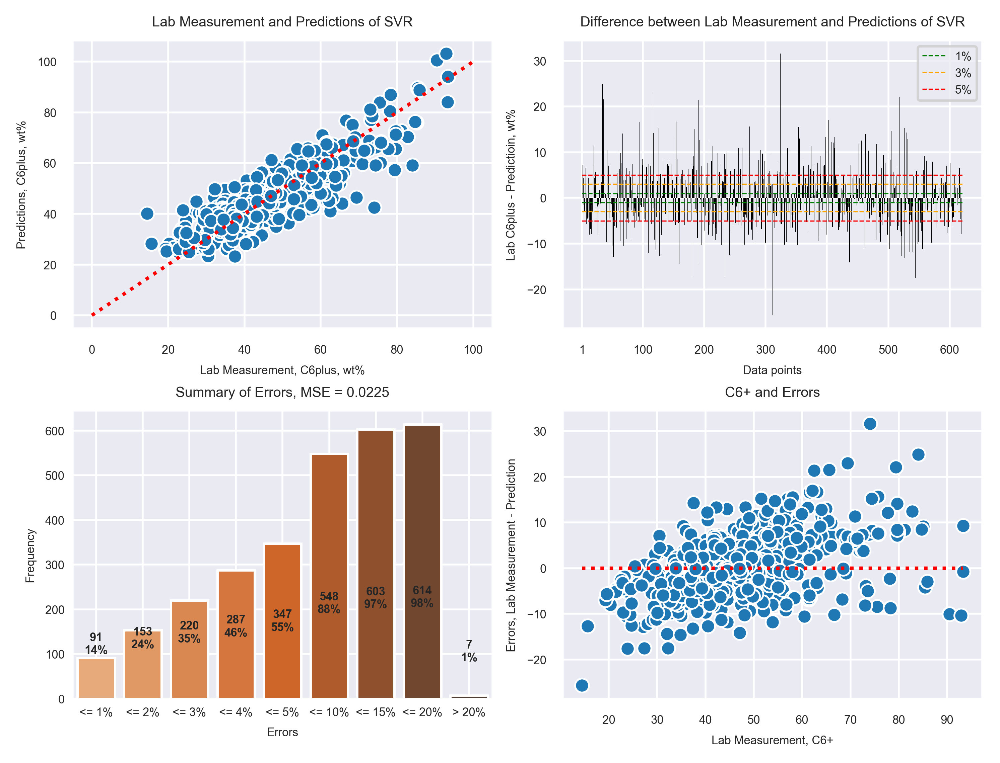

In [24]:
# Cluster1, subcluster1, training
y = np.log1p(y_tr1[(y_tr1.Labels == 1)&(y_tr1.Labels2 == 1)].C6plus_mol)
x = x_tr1[(y_tr1.Labels == 1)&(y_tr1.Labels2 == 1)]

gpr1 = make_pipeline(RobustScaler(), SVR(**s_bp1))
g_pred1 = gpr1.fit(x, y).predict(x)
plot_pred(g_pred1, y, 'SVR', mean_squared_error(g_pred1, y))

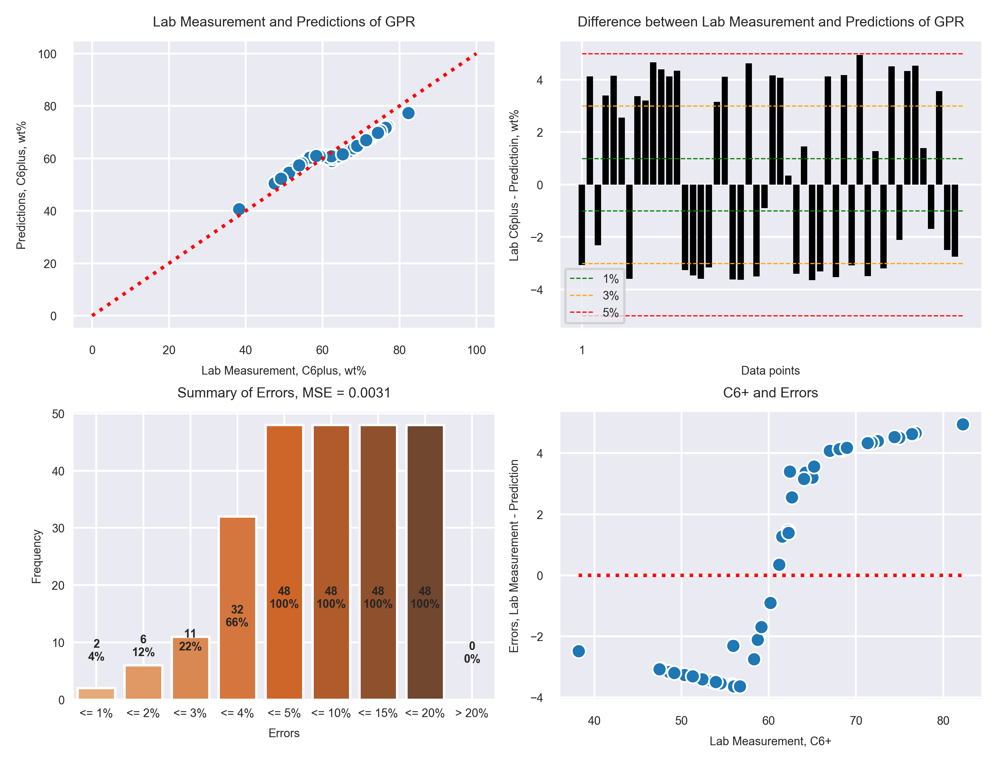

In [70]:
s_bp2 = {'C': 54.2751293121201,
 'epsilon': 0.061519437269968086,
 'gamma': 18.020982612596974,
 'kernel': 'rbf'}
# Cluster1, subcluster2
y = np.log1p(y_va1[(y_va1.Labels == 1)&(y_va1.Labels2 == 2)].C6plus_mol)
x = x_va1[(y_va1.Labels == 1)&(y_va1.Labels2 == 2)]

gpr1 = make_pipeline(RobustScaler(), SVR(**s_bp2))
g_pred1 = gpr1.fit(x, y).predict(x)
plot_pred(g_pred1, y, 'GPR', mean_squared_error(g_pred1, y))

In [71]:
np.expm1(gpr1.predict(nx_test2))

array([60.851723])

In [42]:
y_t = y_va1[(y_va1.Labels == 1)&(y_va1.Labels2 == 2)]

In [43]:
y_t.head()

,C6plus_mol,GOR_scf_stb,Labels,Labels2
451,47.535717,421.961635,1,2
95,68.409897,158.343000,1,2
435,55.893722,415.925510,1,2
216,62.418527,247.778720,1,2
237,68.269555,267.602028,1,2


In [46]:
test = BaseModels(SVR, pd.DataFrame(np.log1p(y_t.C6plus_mol)), pd.DataFrame(np.log(y_t.GOR_scf_stb)), pd.DataFrame(np.log1p(y_t.C6plus_mol)), pd.DataFrame(np.log(y_t.GOR_scf_stb)), 5)
t_bp, _, _ = test.tuningSVR(1000)

100%|███████████████████████████████████████████████| 1000/1000 [00:32<00:00, 31.20it/s, best loss: 0.2025638599919335]


C:\Users\YWu42\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


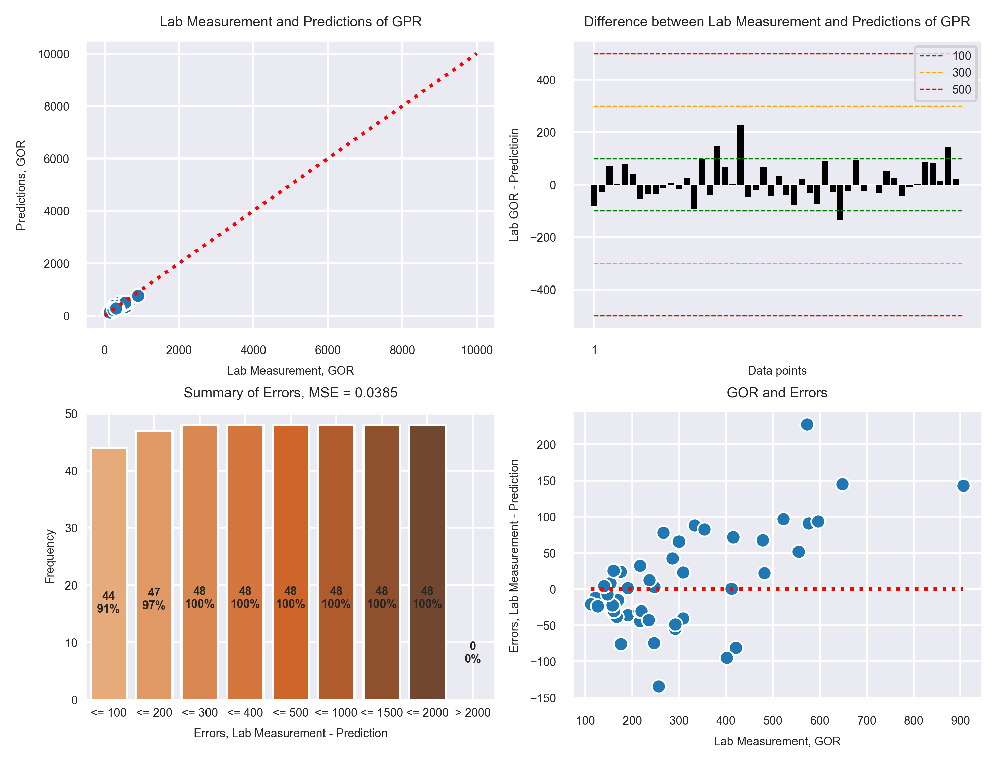

In [49]:
gpr1 = make_pipeline(RobustScaler(), SVR(**t_bp))
g_pred1 = gpr1.fit(pd.DataFrame(np.log1p(y_t.C6plus_mol)), pd.DataFrame(np.log(y_t.GOR_scf_stb))).predict(pd.DataFrame(np.log1p(y_t.C6plus_mol)))
plot_pred2(g_pred1, np.log(y_t.GOR_scf_stb), 'GPR', mean_squared_error(g_pred1, np.log(y_t.GOR_scf_stb)))

C:\Users\YWu42\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


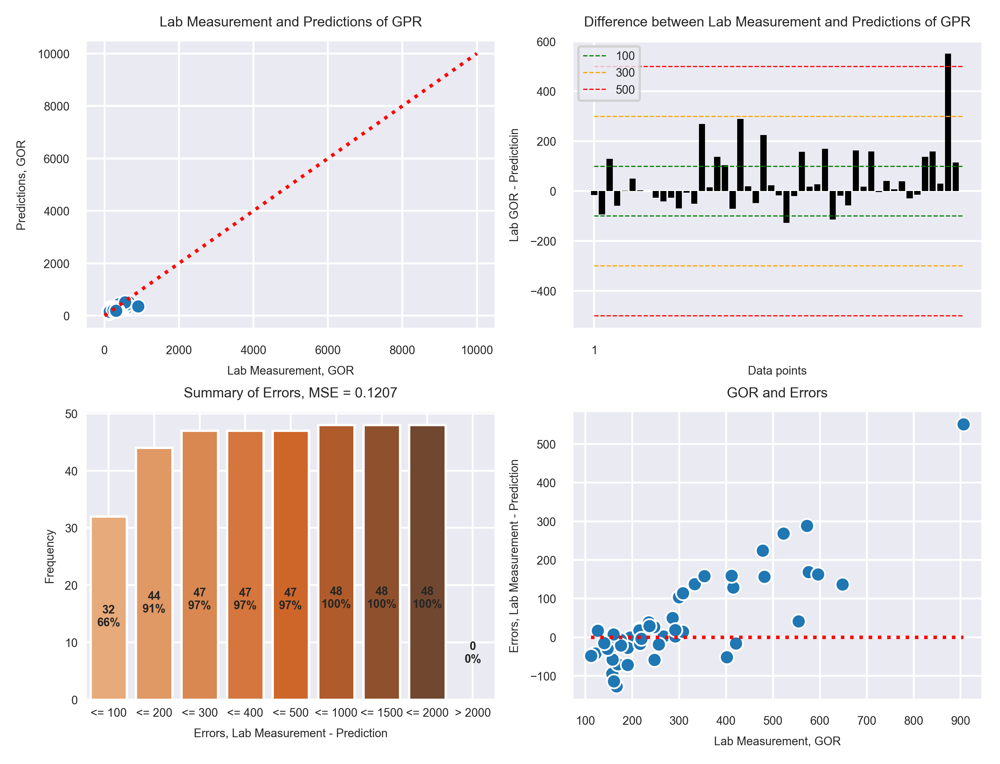

In [52]:
g_pred2 = gpr1.fit(pd.DataFrame(np.log1p(y_t.C6plus_mol)), pd.DataFrame(np.log(y_t.GOR_scf_stb))).predict(pd.DataFrame((g_pred1)))
plot_pred2(g_pred2, np.log(y_t.GOR_scf_stb), 'GPR', mean_squared_error(g_pred2, np.log(y_t.GOR_scf_stb)))

In [92]:
# Linear model
p_spa = {
            'C': hp.uniform('C', 0, 1000),
            'kernel': hp.choice('kernel', ['linear']),
            'epsilon': hp.uniform('epsilon', 0, 1)
        }
l_svr = BaseModels(SVR, x_tr0, pd.DataFrame(np.log1p(y_tr0.C6plus_mol)), x_tr0, pd.DataFrame(np.log1p(y_tr0.C6plus_mol)), 5)
# x_tr0, np.log1p(y_tr0.C6plus_mol)).predict(x_va0)
l_svr.tuning(p_spa, 500)

100%|█████████████████████████████████████████████████| 500/500 [02:00<00:00,  3.61it/s, best loss: 0.2854402496660101]


({'C': 437.33912616689975, 'epsilon': 0.17814372345683707, 'kernel': 0},
 0.2854402496660101,
 [{'state': 2,
   'tid': 0,
   'spec': None,
   'result': {'loss': 0.2931327423923955, 'status': 'ok'},
   'misc': {'tid': 0,
    'cmd': ('domain_attachment', 'FMinIter_Domain'),
    'workdir': None,
    'idxs': {'C': [0], 'epsilon': [0], 'kernel': [0]},
    'vals': {'C': [645.9518144537735],
     'epsilon': [0.4950292052312899],
     'kernel': [0]}},
   'exp_key': None,
   'owner': None,
   'version': 0,
   'book_time': datetime.datetime(2019, 5, 7, 14, 37, 43, 404000),
   'refresh_time': datetime.datetime(2019, 5, 7, 14, 37, 43, 484000)},
  {'state': 2,
   'tid': 1,
   'spec': None,
   'result': {'loss': 0.43718829656505315, 'status': 'ok'},
   'misc': {'tid': 1,
    'cmd': ('domain_attachment', 'FMinIter_Domain'),
    'workdir': None,
    'idxs': {'C': [1], 'epsilon': [1], 'kernel': [1]},
    'vals': {'C': [869.5419475856938],
     'epsilon': [0.8695367405818851],
     'kernel': [0]}},
   '

In [98]:
l_svr2 = make_pipeline(RobustScaler(), SVR(**{'C': 437.33912616689975, 'epsilon': 0.17814372345683707, 'kernel': 'linear'}))
t = l_svr2.fit(x_tr0, pd.DataFrame(np.log1p(y_tr0.C6plus_mol))).predict(np.log1p(nx_test2))

C:\Users\YWu42\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [99]:
np.expm1(t)

array([9.12660683])

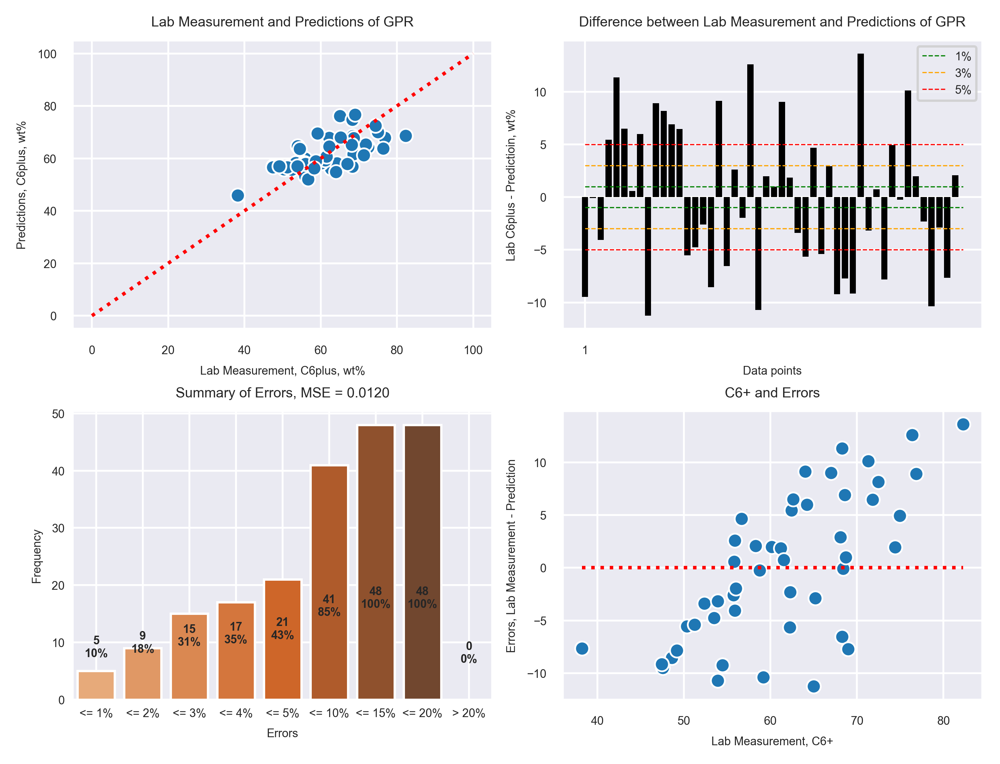

In [100]:
y = np.log1p(y_va1[(y_va1.Labels == 1)&(y_va1.Labels2 == 2)].C6plus_mol)
x = x_va1[(y_va1.Labels == 1)&(y_va1.Labels2 == 2)]

gpr1 = make_pipeline(RobustScaler(), SVR(**{'C': 437.33912616689975, 'epsilon': 0.17814372345683707, 'kernel': 'linear'}))
g_pred1 = gpr1.fit(x, y).predict(x)
plot_pred(g_pred1, y, 'GPR', mean_squared_error(g_pred1, y))

# 9. Final workflow to C6+

## First classification, cluster GC

In [10]:
def get1stclassData(lab):
    x_tr0, y_tr0, x_va0, y_va0 = X_train[y_train.New_label == lab], y_train[y_train.New_label == lab], X_val[y_val.New_label == lab], y_val[y_val.New_label == lab]
    return x_tr0, y_tr0, x_va0, y_va0
# def get2ndclassData(lab):
#     x_tr1_sub1, y_tr1_sub1, x_val1_sub1, y_va1_sub1 = x_tr1[y_tr1.Labels2 == lab], y_tr1[y_tr1.Labels2 == lab], x_va1[y_va1.Labels2 == lab], y_va1[y_va1.Labels2 == lab]
#     return x_tr1_sub1, y_tr1_sub1, x_val1_sub1, y_va1_sub1

In [11]:
total_y.groupby(['New_label']).agg('count')

,C6plus_mol,GOR_scf_stb,Labels,Labels2,Type,Type2
New_label,,,,,,
0,250,250,250,250,250,250
1,2033,1584,2033,2033,2033,2033


#### 1st classification

In [33]:
# # SVM for 1st classification
# C_rf = BaseModelsClf(RandomForestClassifier, X_train, y_train.New_label, X_train, y_train.New_label, 5)
# par_spa = {
#         'n_estimators': scope.int(hp.uniform('n_estimators', 1, 1000)),
#         'max_depth': scope.int(hp.uniform('max_depth', 1, 30))
# }
# a3, _, _ = C_rf.tuning(par_spa, 100)
# a3

In [12]:
## 1st classification
## max_depth:6, n_estimators:520 when 18 is the boundry
rf_clfbp = {'max_depth': 10, 'n_estimators': 558}
# rf_clfbp = {'C': 1, 'gamma': 670.2277868671383, 'kernel': 'rbf'}
rf_clf1 = (RandomForestClassifier(**rf_clfbp, class_weight={0:10, 1:1}))
label_pred = rf_clf1.fit((X_train), y_train.New_label).predict((X_val))
print('The first classification accuracy is: %.2f%%'%(100*accuracy_score(label_pred, y_val.New_label)))

The first classification accuracy is: 91.03%


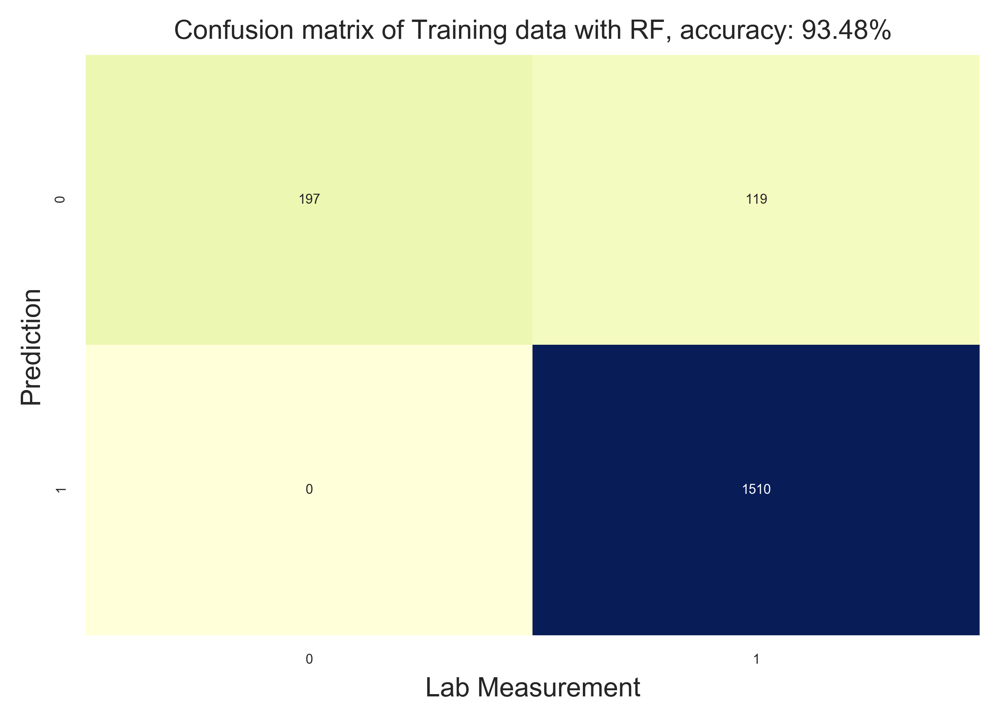

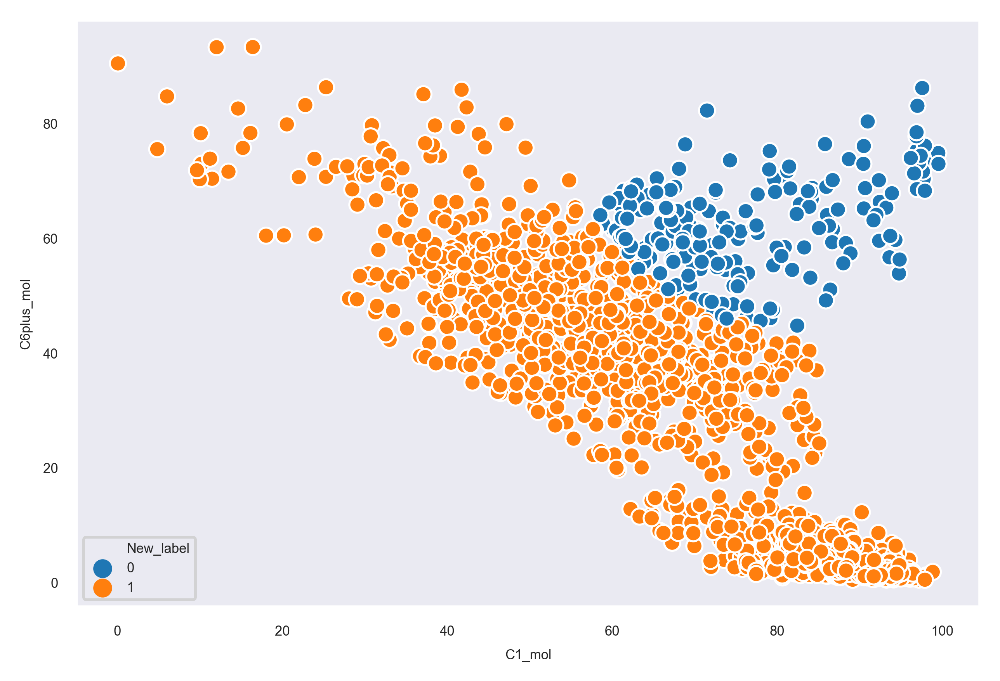

In [13]:
plotconfmat('Training data with RF', rf_clf1.predict(X_train), y_train.New_label)
sns.scatterplot(np.expm1(X_train.C1_mol), y_train.C6plus_mol, hue = y_train.New_label)

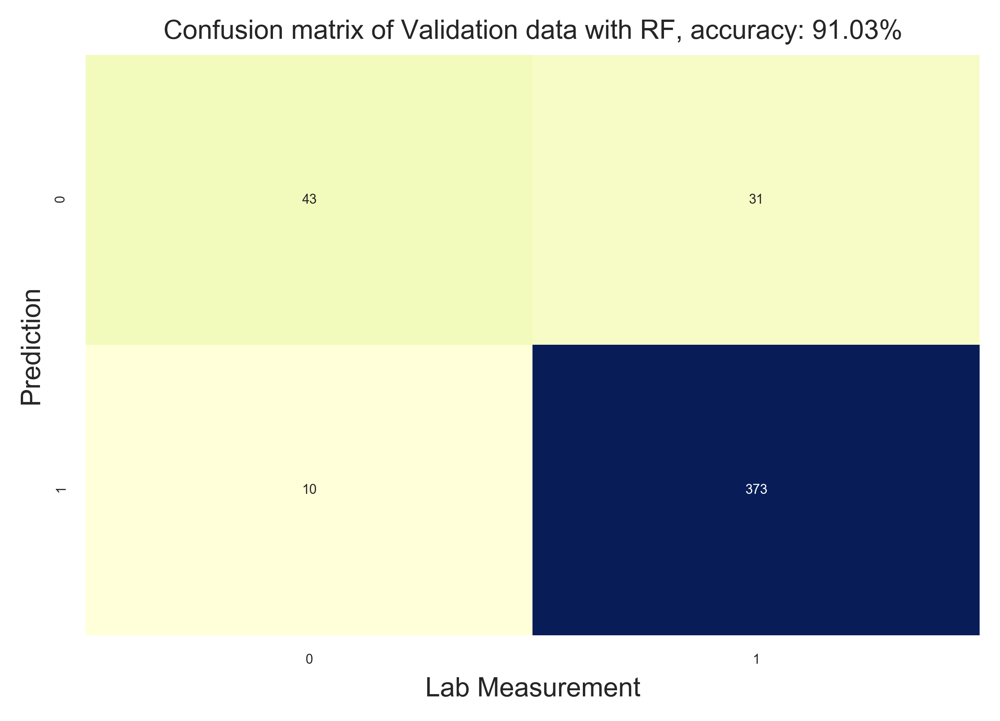

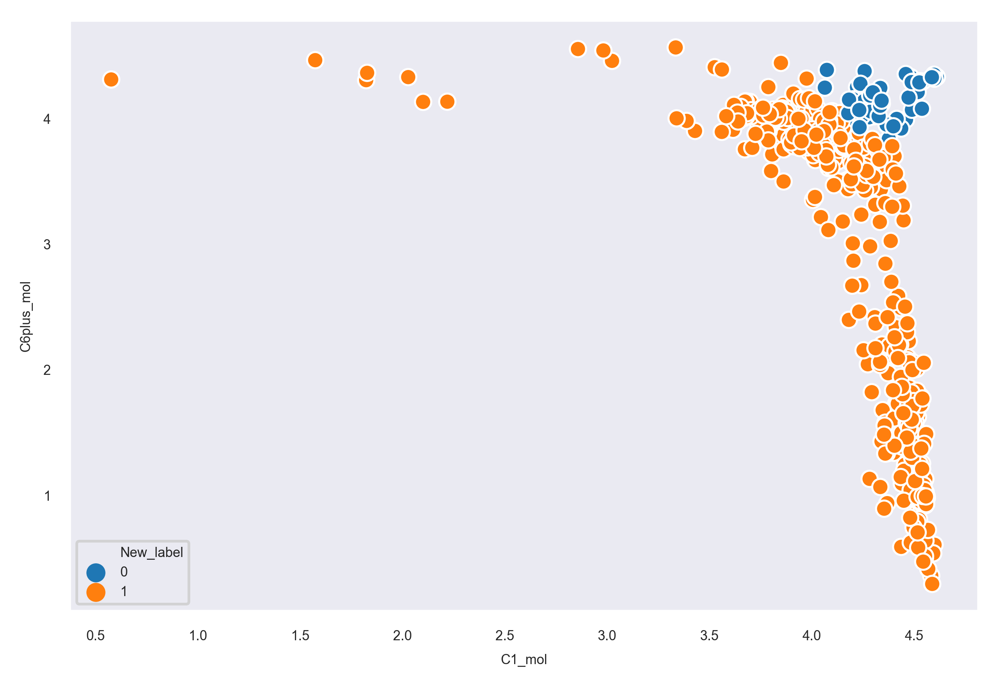

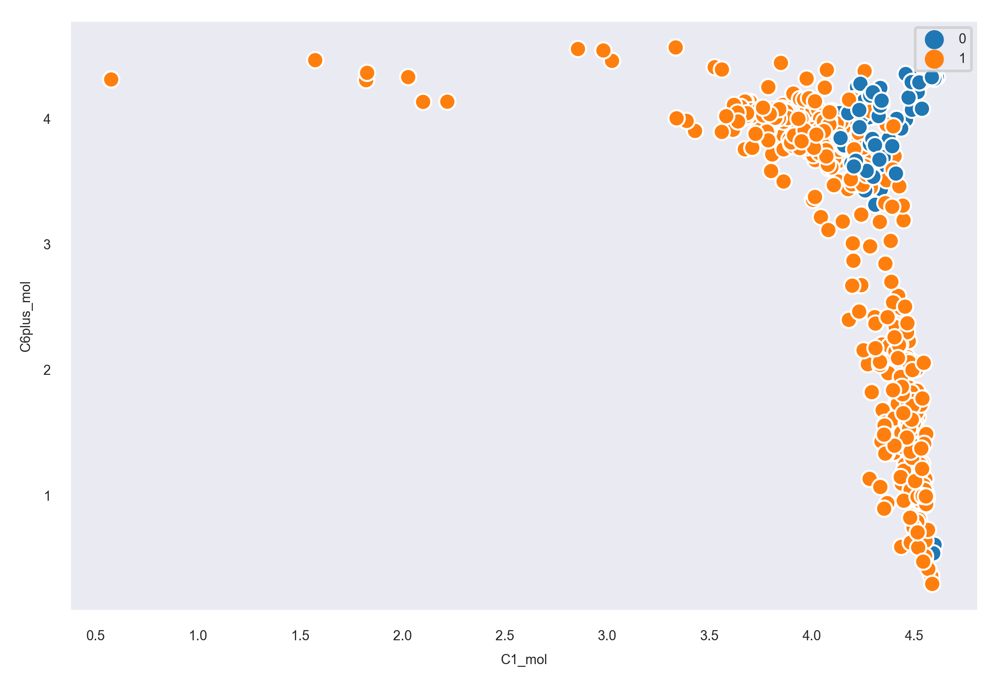

In [14]:
plotconfmat('Validation data with RF', rf_clf1.predict(X_val), y_val.New_label)
sns.scatterplot((X_val.C1_mol), np.log1p(y_val.C6plus_mol), hue = y_val.New_label)
plt.show()
sns.scatterplot((X_val.C1_mol), np.log1p(y_val.C6plus_mol), hue = rf_clf1.predict(X_val))
plt.show()

In [42]:
t_lab = rf_clf1.predict(X_test2)
# plotconfmat('81 test data with RF', t_lab, Y_test2_labels)
# sns.scatterplot(np.expm1(X_test2.C1_mol), test_features2.C6plus_mol, hue = t_lab)
t_lab

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

#### 1st regression, on data from cluster 0 (GC)

In [15]:
# First non-linear regression, RF, to predict C6+
x_tr0, y_tr0, x_va0, y_va0 = get1stclassData(0)
y_tr0_C6, y_va0_C6 = np.log1p(y_tr0.C6plus_mol), np.log1p(y_va0.C6plus_mol)

In [44]:
# # Tuning the first RF regression model for C6+ prediction of cluster 0
# rf1 = BaseModels(RandomForestRegressor, x_tr0, pd.DataFrame(y_tr0_C6), x_va0, pd.DataFrame(y_va0_C6), 5)
# rf_regbp, _, _ = rf1.tuningRF(50)
# rf_regbp

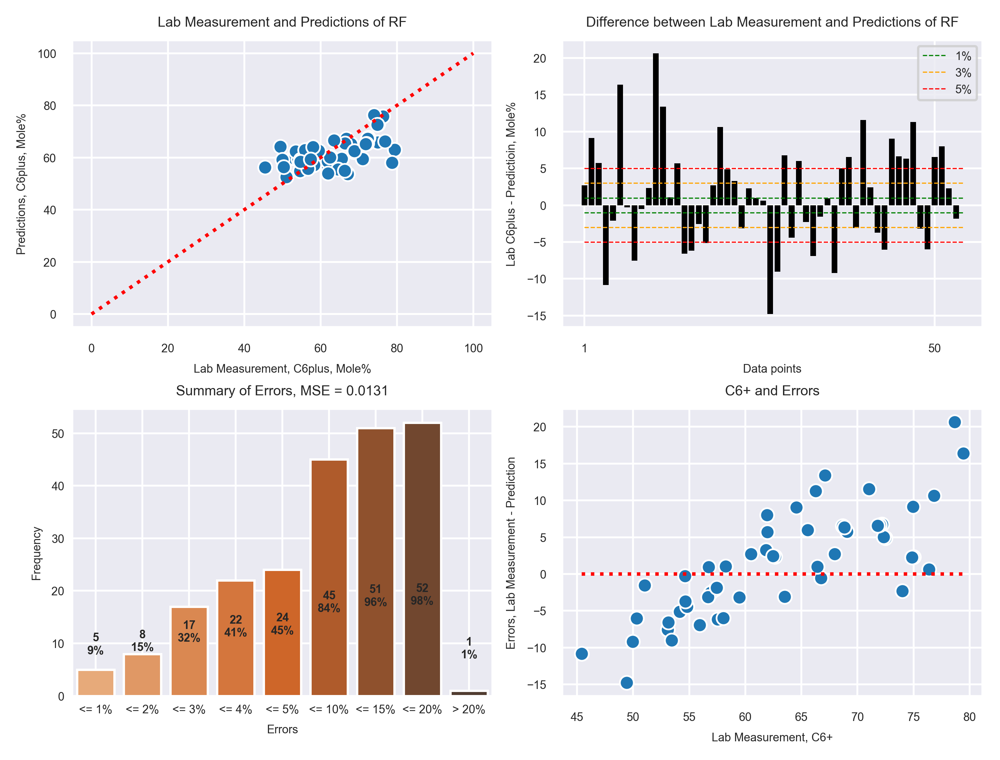

In [16]:
## Best parameters when 18% is the boundry
rf_regbp = {'criterion': 'mae',
 'max_depth': 6,
 'max_features': 1,
 'n_estimators': 2760,
 'n_jobs': -1,
 'random_state': 42}
## Validation
rf_reg1 = RandomForestRegressor(**rf_regbp).fit(x_tr0, y_tr0_C6)
rf1_pred = rf_reg1.predict(x_va0)
plot_pred((rf1_pred), (y_va0_C6), 'RF', mean_squared_error((rf1_pred), (y_va0_C6)))

In [60]:
# # Training
# rf_reg1 = RandomForestRegressor(**rf_regbp).fit(x_tr0, y_tr0_C6)
# rf1_pred = rf_reg1.predict(x_tr0)
# plot_pred(rf1_pred, y_tr0_C6, 'RF', mean_squared_error(rf1_pred, y_tr0_C6))

In [19]:
# ## Test on the 5 samples
print('The predicted C6+ for the 5 samples are: ', np.expm1(rf_reg1.predict(X_test)))

The predicted C6+ for the 5 samples are:  [54.77986224 54.70580645 59.45813555 57.01211987 60.13299952]


#### 1st regression, on data from cluster 1 (GC)

In [20]:
# First non-linear regression, RF, to predict C6+
x_tr1, y_tr1, x_va1, y_va1 = get1stclassData(1)
y_tr1_C6, y_va1_C6 = np.log1p(y_tr1.C6plus_mol), np.log1p(y_va1.C6plus_mol)

In [21]:
# # Tuning the 2nd RF regression model for C6+ prediction of cluster 0
# rf2 = BaseModels(RandomForestRegressor, x_tr1, pd.DataFrame(y_tr1_C6), x_va1, pd.DataFrame(y_va1_C6), 5)
# rf_regbp2, _, _ = rf2.tuningRF(20)
# rf_regbp2

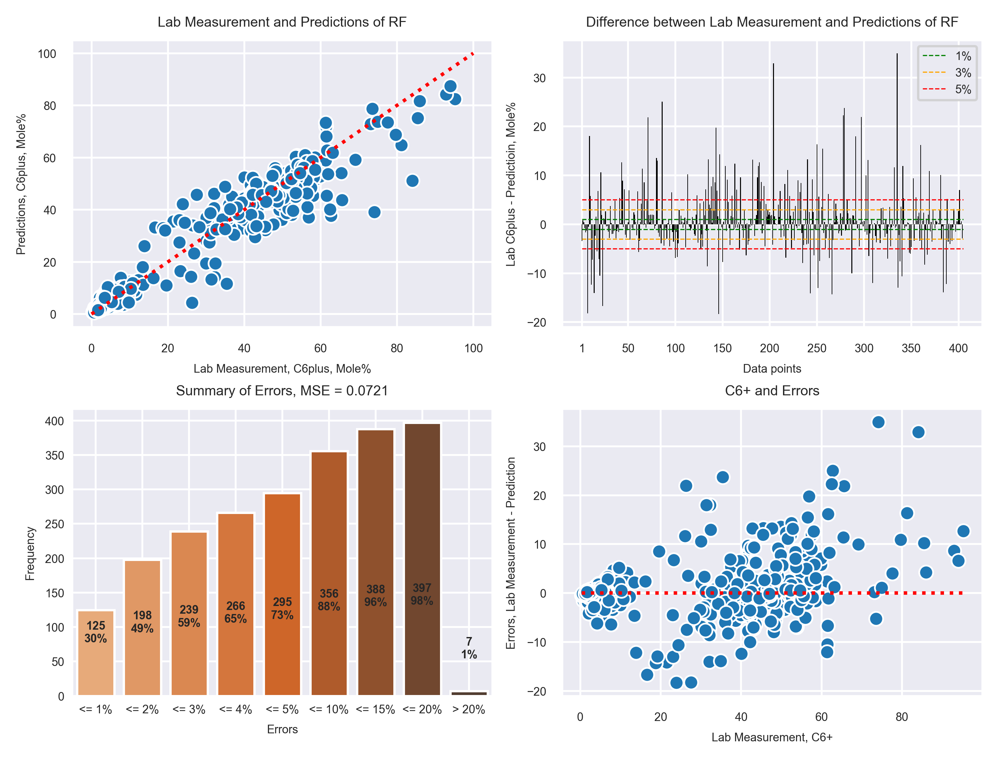

In [22]:
rf_regbp2 = {'criterion': 'mae',
 'max_depth': 13,
 'max_features': 2,
 'n_estimators': 2260,
 'n_jobs': -1,
 'random_state': 42}
# Validation
rf_reg2 = RandomForestRegressor(**rf_regbp2).fit(x_tr1, y_tr1_C6)
rf2_pred = rf_reg2.predict(x_va1)
plot_pred((rf2_pred), (y_va1_C6), 'RF', mean_squared_error((rf2_pred), (y_va1_C6)))

## 2nd classification, on data from cluster 1 (Oils)

In [54]:
# Get the data of cluster 1
x_tr1, y_tr1, x_va1, y_va1 = get1stclassData(1)

In [55]:
# # Randomforest for 2nd classification
# C_rf = BaseModels(RandomForestClassifier, x_tr1, y_tr1.Labels2, x_va1, y_va1.Labels2, 5)
# par_spa = {
#         'n_estimators': scope.int(hp.uniform('n_estimators', 1, 1000)),
# #         'max_depth': hp.choice('kernel', ['rbf']),
#         'max_depth': scope.int(hp.uniform('max_depth', 1, 30))
# }
# a3, _, _ = C_rf.tuning(par_spa, 200)
# a3

In [56]:
## 2nd classification
## max_depth:6, n_estimators:520 when 18 is the boundry
rf_clf2bp = {'max_depth': 6, 'n_estimators': 175}
rf_clf2 = RandomForestClassifier(**rf_clf2bp)
label_pred2 = rf_clf2.fit((x_tr1), y_tr1.Labels2).predict((x_va1))
print('The second classification accuracy is: %.2f%%'%(100*accuracy_score(label_pred2, y_va1.Labels2)))

The second classification accuracy is: 97.77%


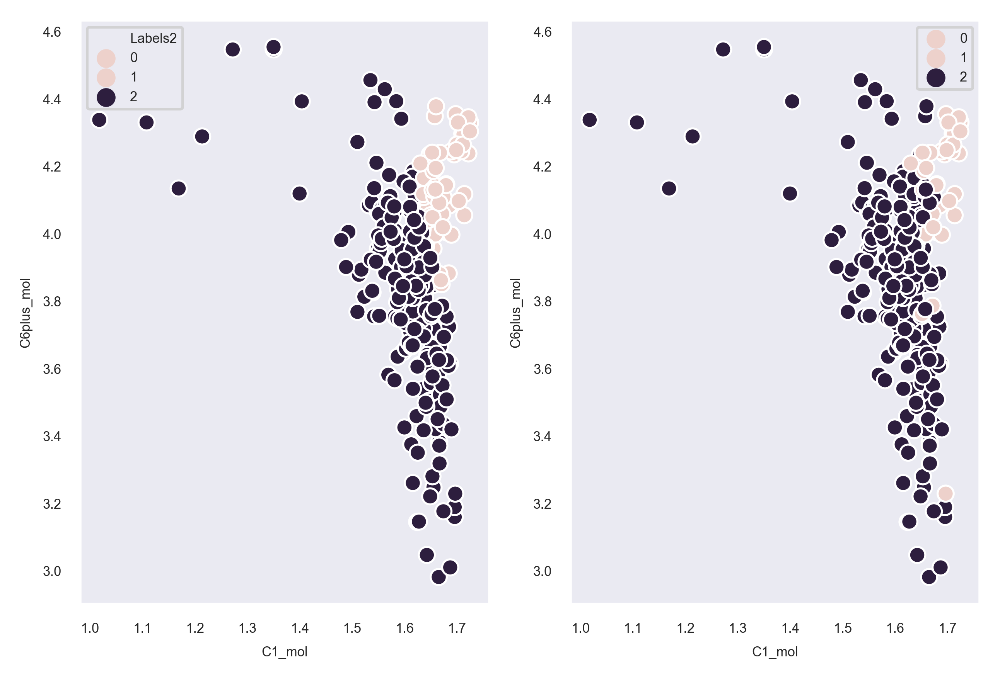

In [127]:
# plot the classificationi results of validation sets
plt.subplot(1,2,1)
sns.scatterplot(np.log1p(x_va1.C1_mol), np.log1p(y_va1.C6plus_mol), hue = y_va1.Labels2)
plt.subplot(1,2,2)
sns.scatterplot(np.log1p(x_va1.C1_mol), np.log1p(y_va1.C6plus_mol), hue = label_pred2)

##### 2nd classification, subset 1

In [59]:
x_tr1_sub1, y_tr1_sub1, x_val1_sub1, y_va1_sub1 = get2ndclassData(1)

NameError: name 'get2ndclassData' is not defined

In [60]:
# # ## Tuning the first RF regression model for C6+ prediction of cluster 1, subset 1
# rf1_1 = BaseModels(RandomForestRegressor, x_tr1_sub1, pd.DataFrame(np.log1p(y_tr1_sub1.C6plus_mol)), x_val1_sub1, pd.DataFrame(np.log1p(y_va1_sub1.C6plus_mol)), 5)
# rf_regbp1_1, _, _ = rf1_1.tuningRF(50)

In [61]:
# validation
rf_regbp1_1 = {'criterion': 'mse',
 'max_depth': 9,
 'max_features': 1,
 'n_estimators': 750,
 'n_jobs': -1,
 'random_state': 42}
rf_reg1_1 = RandomForestRegressor(**rf_regbp1_1).fit(x_tr1_sub1, np.log1p(y_tr1_sub1.C6plus_mol))
rf1_pred1_1 = rf_reg1_1.predict(x_val1_sub1)
plot_pred(rf1_pred1_1, np.log1p(y_va1_sub1.C6plus_mol), 'RF', mean_squared_error(rf1_pred1_1, np.log1p(y_va1_sub1.C6plus_mol)))

NameError: name 'x_tr1_sub1' is not defined

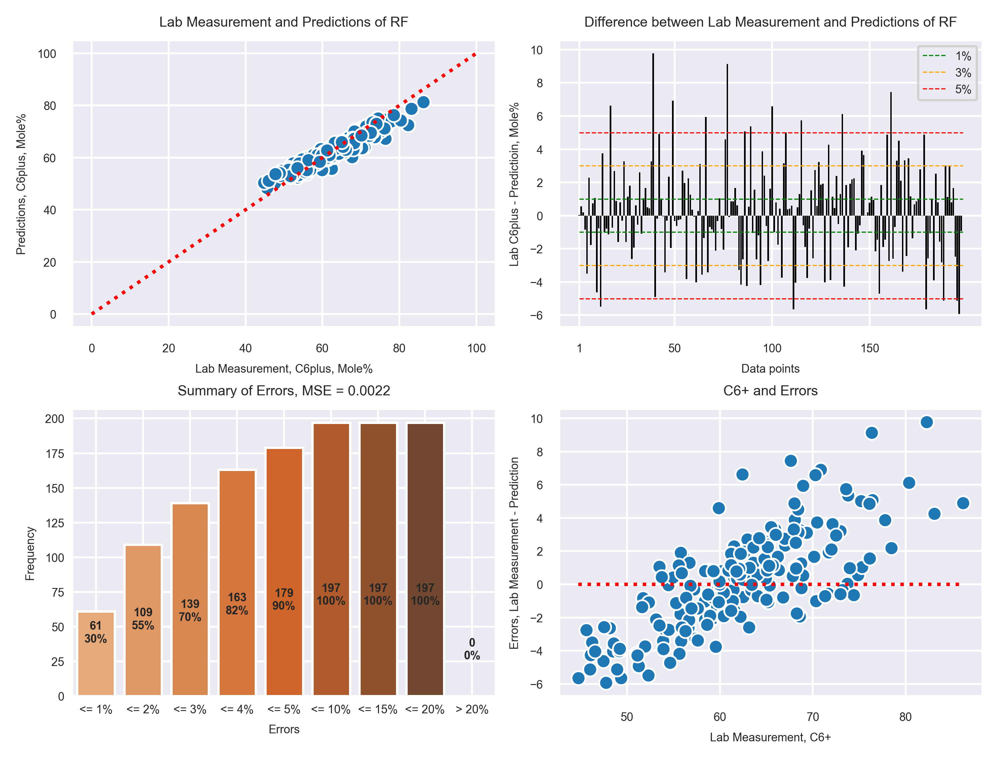

In [161]:
# training
rf_reg1_1 = RandomForestRegressor(**rf_regbp1_1).fit(x_tr1_sub1, np.log1p(y_tr1_sub1.C6plus_mol))
rf1_pred1_1 = rf_reg1_1.predict(x_tr1_sub1)
plot_pred(rf1_pred1_1, np.log1p(y_tr1_sub1.C6plus_mol), 'RF', mean_squared_error(rf1_pred1_1, np.log1p(y_tr1_sub1.C6plus_mol)))

In [143]:
np.expm1(rf_reg1_1.predict(X_test))

array([53.57224685, 51.69242683, 57.44470056, 58.53849302, 59.43599919])

##### 2nd classification, subset 2

In [138]:
x_tr1_sub2, y_tr1_sub2, x_val1_sub2, y_va1_sub2 = get2ndclassData(2)

In [139]:
# ## Tuning the first RF regression model for C6+ prediction of cluster 1, subset 1
rf1_2 = BaseModels(RandomForestRegressor, x_tr1_sub2, pd.DataFrame(np.log1p(y_tr1_sub2.C6plus_mol)), x_val1_sub2, pd.DataFrame(np.log1p(y_va1_sub2.C6plus_mol)), 5)
rf_regbp1_2, _, _ = rf1_2.tuningRF(50)
rf_regbp1_2

100%|██████████████████████████████████████████████████| 50/50 [08:57<00:00,  8.68s/it, best loss: 0.16670815160472646]


{'criterion': 'mae',
 'max_depth': 7,
 'max_features': 3,
 'n_estimators': 450,
 'n_jobs': -1,
 'random_state': 42}

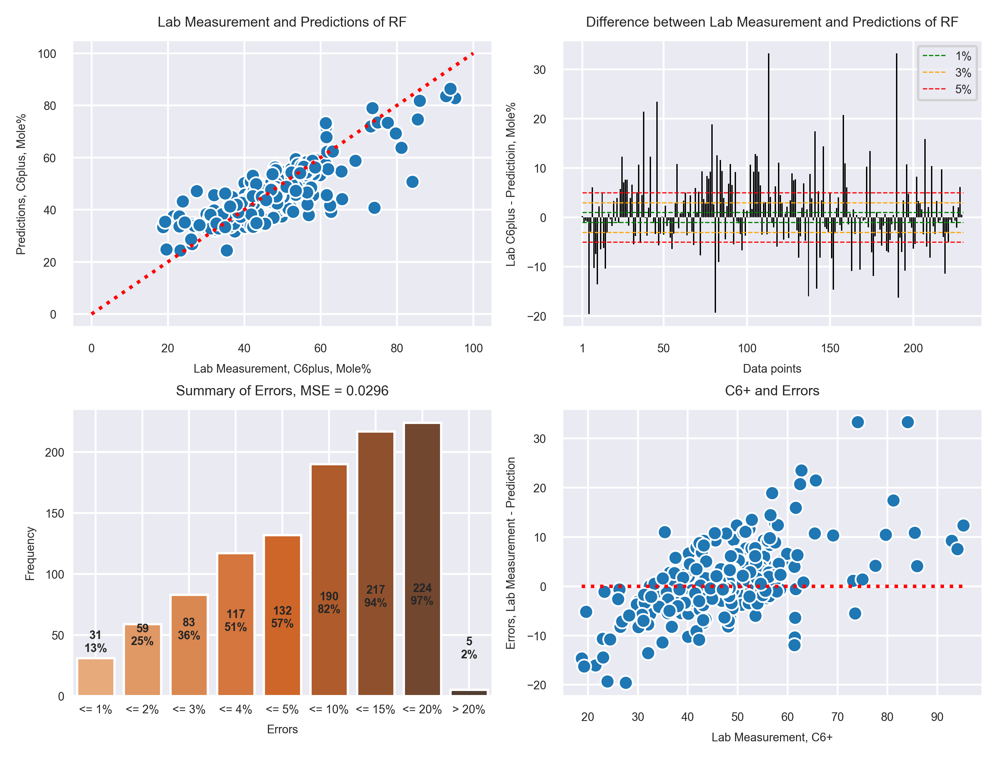

In [162]:
# validation
# rf_regbp1_2 = {'criterion': 'mae',
#  'max_depth': 7,
#  'max_features': 3,
#  'n_estimators': 450,
#  'n_jobs': -1,
#  'random_state': 42}
rf_reg1_2 = RandomForestRegressor(**rf_regbp1_2).fit(x_tr1_sub2, np.log1p(y_tr1_sub2.C6plus_mol))
rf1_pred1_2 = rf_reg1_2.predict(x_val1_sub2)
plot_pred(rf1_pred1_2, np.log1p(y_va1_sub2.C6plus_mol), 'RF', mean_squared_error(rf1_pred1_2, np.log1p(y_va1_sub2.C6plus_mol)))

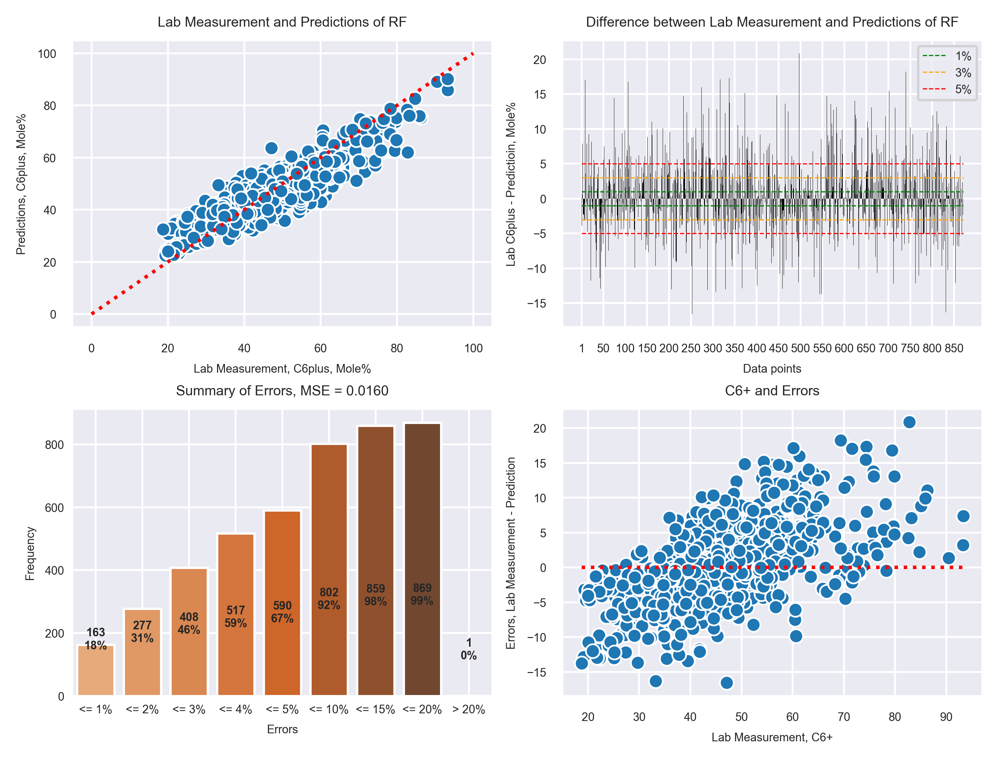

In [163]:
# training
rf_reg1_2 = RandomForestRegressor(**rf_regbp1_2).fit(x_tr1_sub2, np.log1p(y_tr1_sub2.C6plus_mol))
rf1_pred1_2 = rf_reg1_2.predict(x_tr1_sub2)
plot_pred(rf1_pred1_2, np.log1p(y_tr1_sub2.C6plus_mol), 'RF', mean_squared_error(rf1_pred1_2, np.log1p(y_tr1_sub2.C6plus_mol)))

In [142]:
np.expm1(rf_reg1_2.predict(X_test))

array([27.82915595, 32.96975669, 33.94935139, 32.97872348, 35.17505865])

## weighted predictions

In [23]:
def max_pre(X_test):
    X_test2 = copy.copy(X_test)
    X_test2['C0_pro'] = rf_clf1.predict_proba(X_test)[:,0]

    fir_pro = rf_clf1.predict_proba(X_test)[:,1]

#     sec_pro = rf_clf2.predict_proba(X_test)
    X_test2['C1_pro'] = rf_clf1.predict_proba(X_test)[:,1]
#     X_test2['C2_pro'] = fir_pro*sec_pro[:,1]
    max_table = np.zeros((X_test2.shape[0], 2))
    
    for i in range(X_test2.shape[0]):
        line = X_test2.loc[i, ['C0_pro', 'C1_pro']]
        ind = np.where(line == max(line))
        max_table[i, ind] = 1
    X_test2['Max_predictions'] = np.expm1(max_table[:,0]*rf_reg1.predict(X_test) + max_table[:,1]*rf_reg2.predict(X_test))
    X_test3 = pd.concat((np.expm1(X_test[['C1_mol', 'C2_mol', 'C3_mol', 'C4_mol', 'C5_mol']]), X_test2[['C0_pro', 'C1_pro', 'Max_predictions']]), axis = 1)
    return X_test3

In [24]:
def weighted_pre(X_test):
    X_test2 = copy.copy(X_test)
    X_test2['C0_pro'] = rf_clf1.predict_proba(X_test)[:,0]

    X_test2['C1_pro'] = rf_clf1.predict_proba(X_test)[:,1]

    X_test2['Weighted_predictions'] = np.expm1(X_test2['C0_pro']*rf_reg1.predict(X_test) + X_test2['C1_pro']*rf_reg2.predict(X_test))
    X_test3 = pd.concat((np.expm1(X_test[['C1_mol', 'C2_mol', 'C3_mol', 'C4_mol', 'C5_mol']]), X_test2[['C0_pro', 'C1_pro', 'Weighted_predictions']]), axis = 1)
    return X_test3

In [25]:
def weighted_pre2(X_test):
    X_test2 = copy.copy(X_test)
    X_test2['C0_pro'] = rf_clf1.predict_proba(X_test)[:,0]

    X_test2['C1_pro'] = rf_clf1.predict_proba(X_test)[:,1]
    
    X_test2['Weighted_predictions'] = (X_test2['C0_pro']*np.expm1(rf_reg1.predict(X_test))) + X_test2['C1_pro']*np.expm1(rf_reg2.predict(X_test))
    X_test3 = pd.concat((np.expm1(X_test[['C1_mol', 'C2_mol', 'C3_mol', 'C4_mol', 'C5_mol']]), X_test2[['C0_pro', 'C1_pro', 'Weighted_predictions']]), axis = 1)
    return X_test3

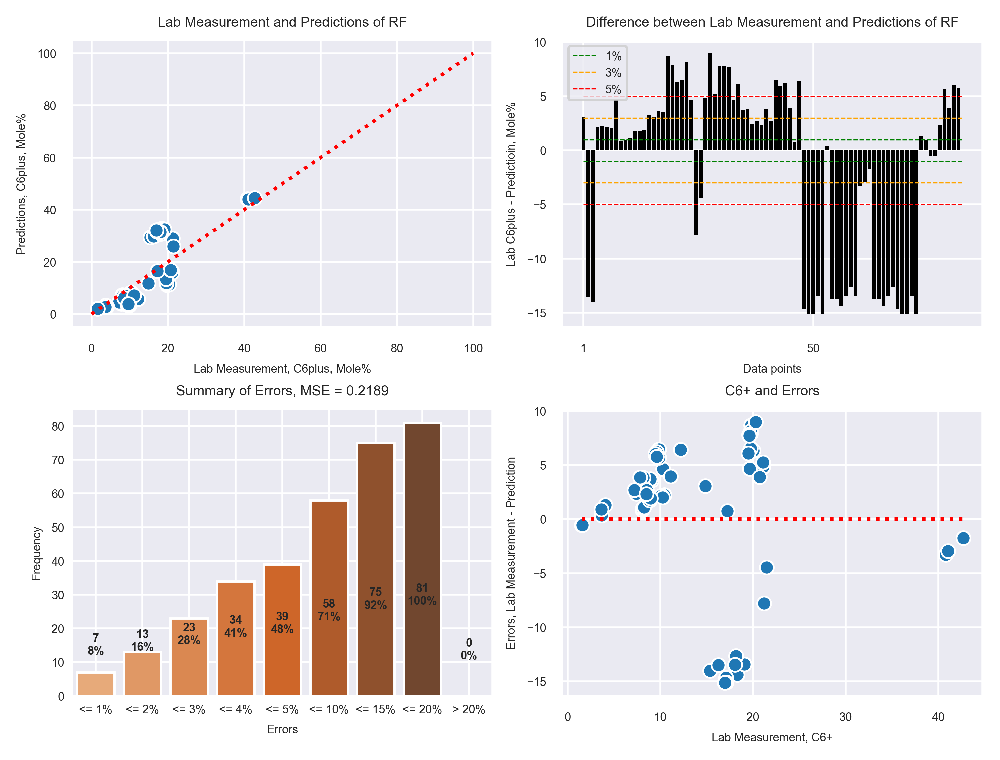

In [26]:
t = np.log1p(weighted_pre(X_test2).Weighted_predictions)
plot_pred(t, np.log1p(test_features2.C6plus_mol), 'RF', mean_squared_error(t, np.log1p(test_features2.C6plus_mol)))

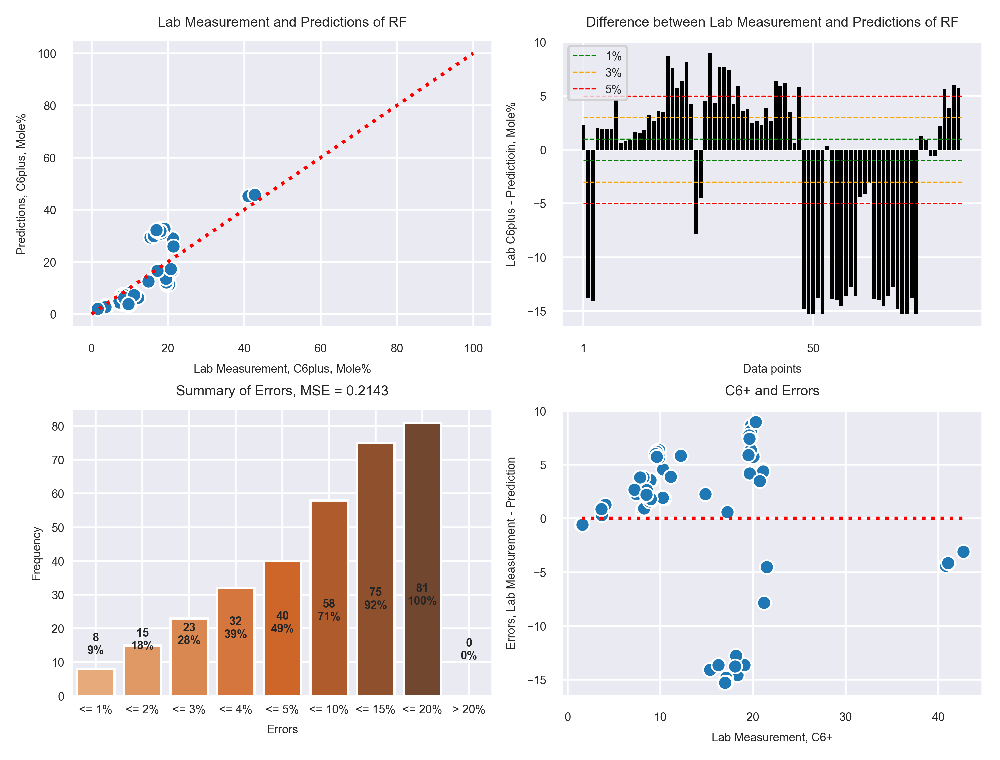

In [27]:
t = np.log1p(weighted_pre2(X_test2).Weighted_predictions)
plot_pred(t, np.log1p(test_features2.C6plus_mol), 'RF', mean_squared_error(t, np.log1p(test_features2.C6plus_mol)))

##### analysis on 85

In [298]:
test_m = weighted_pre(X_test2)
t_lab = rf_clf1.predict(X_test2)
test_m2 = test_m[t_lab != Y_test2_labels]
test_m3 = test_m[t_lab == Y_test2_labels]

In [228]:
test_m2

,C1_mol,C2_mol,C3_mol,C4_mol,C5_mol,C0_pro,C1_pro,C2_pro,Weighted_predictions
0,75.923690,9.695726,7.196329,4.636561,2.547694,0.740232,0.033363,0.226405,12.842105
18,67.834601,14.740324,9.556070,5.009593,2.859411,0.901795,0.006815,0.091390,11.208146
19,67.439213,14.903840,9.568371,5.130309,2.958267,0.777191,0.015664,0.207145,13.274708
20,67.365778,14.869963,9.637914,5.137741,2.988603,0.707497,0.020563,0.271939,15.010897
21,67.439952,14.842851,9.595712,5.143916,2.977569,0.702218,0.020934,0.276848,14.701720
22,67.682540,14.757937,9.588624,5.076720,2.894180,0.851109,0.010297,0.138594,12.133862
23,67.235865,14.827787,9.646850,5.198118,3.091380,0.683210,0.026093,0.290697,15.524265
26,67.140494,14.619616,9.758066,5.303998,3.177826,0.673706,0.027007,0.299286,16.595320
27,67.916611,14.680964,9.547089,4.976688,2.878647,0.860612,0.009673,0.129714,11.842536
28,67.299813,14.640732,9.691979,5.242938,3.124538,0.686378,0.025774,0.287848,15.910787


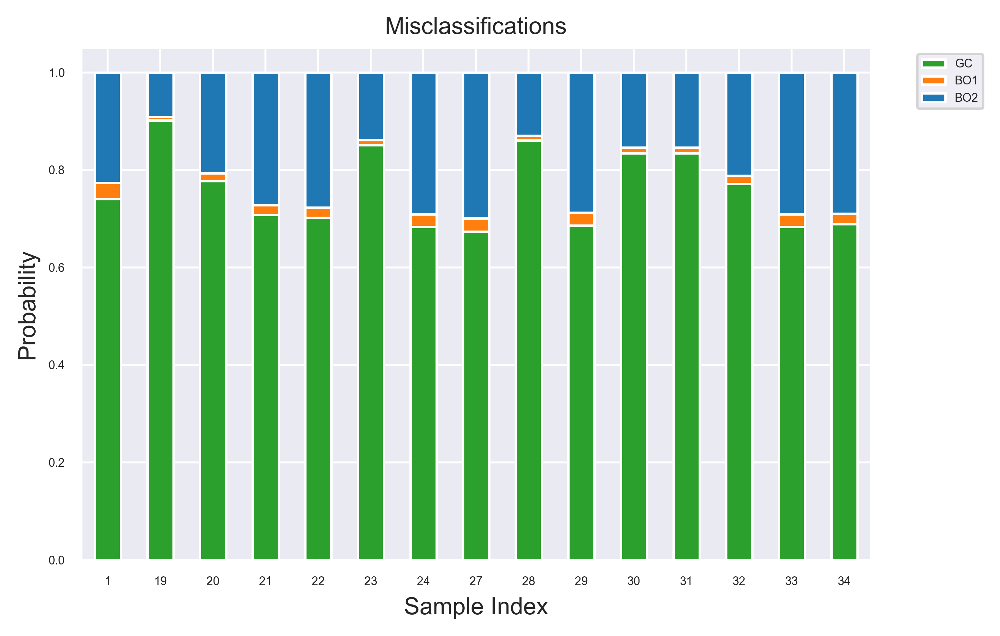

In [299]:
# Mis classification
fs = 10
color_dict = {'C0_pro': sns.color_palette()[2], 'C1_pro': sns.color_palette()[1], 'C2_pro':sns.color_palette()[0]}
new_df = test_m2[['C0_pro', 'C1_pro', 'C2_pro']]
g = new_df.plot(kind='bar', stacked=True, color=[color_dict.get(x, '#333333') for x in new_df.columns])
plt.legend(bbox_to_anchor = [0.5, .5, 0.65, .5])
plt.xticks(range(len(new_df.index)), new_df.index+1, rotation = 0)
L = g.get_legend()
L.get_texts()[0].set_text('GC')
L.get_texts()[1].set_text('BO1')
L.get_texts()[2].set_text('BO2')
plt.xlabel('Sample Index', fontsize = fs)
plt.ylabel('Probability', fontsize = fs)
plt.title('Misclassifications', fontsize = fs)
plt.grid()
plt.show()

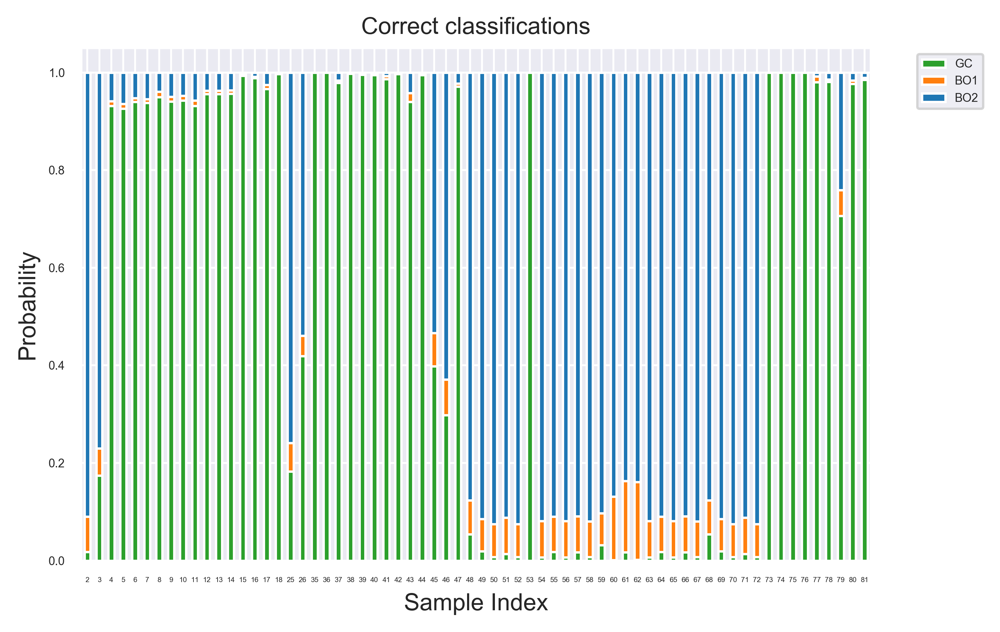

In [302]:
# Correct classification
fs = 10
color_dict = {'C0_pro': sns.color_palette()[2], 'C1_pro': sns.color_palette()[1], 'C2_pro':sns.color_palette()[0]}
new_df = test_m3[['C0_pro', 'C1_pro', 'C2_pro']]
g = new_df.plot(kind='bar', stacked=True, color=[color_dict.get(x, '#333333') for x in new_df.columns])
plt.legend(bbox_to_anchor = [0.5, .5, 0.65, .5])
plt.xticks(range(len(new_df.index)), new_df.index+1, rotation = 0, fontsize = 3)
L = g.get_legend()
L.get_texts()[0].set_text('GC')
L.get_texts()[1].set_text('BO1')
L.get_texts()[2].set_text('BO2')
plt.xlabel('Sample Index', fontsize = fs)
plt.ylabel('Probability', fontsize = fs)
plt.title('Correct classifications', fontsize = fs)
plt.grid()
plt.show()

(10, 25)

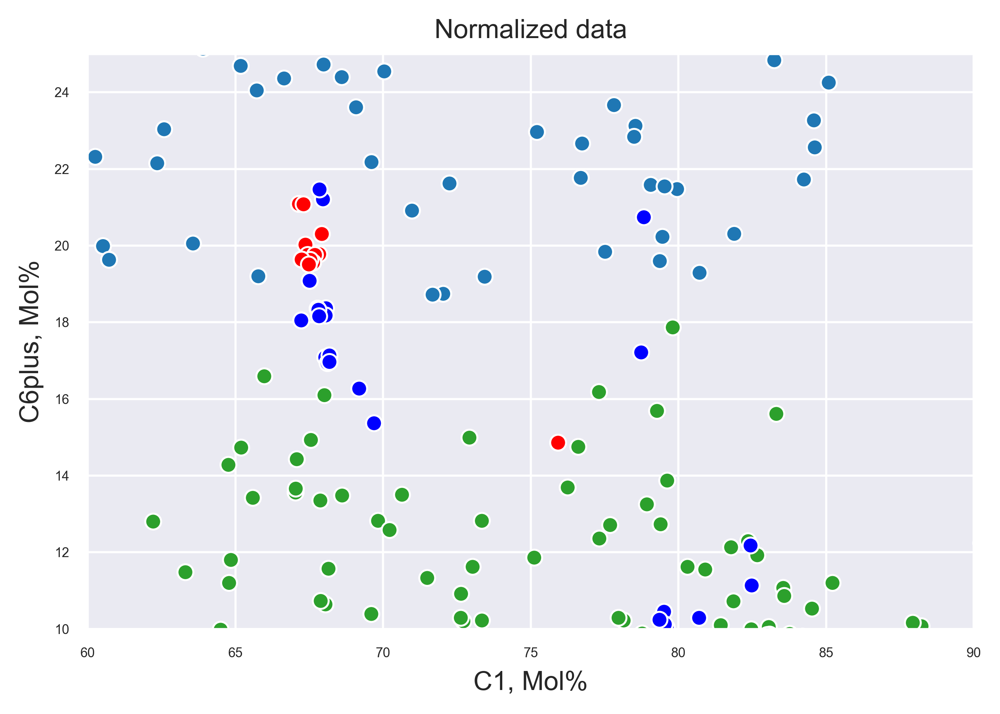

In [227]:
# plt.subplot(1,3,1)
# fs = 10
# sns.scatterplot(test_m.C1_mol, test_features2.C6plus_mol, color = 'blue', label = 'Test data, correctly classified')
# sns.scatterplot(test_m2.C1_mol, test_features2[t_lab != test_label].C6plus_mol, color= 'orange', label = 'Test data, incorrectly classified')
# plt.title("Normalized data", fontsize = fs)
# plt.xlabel("C1, Mol%", fontsize = fs)
# plt.ylabel("C6plus, Mol%", fontsize = fs)
# plt.legend()
# plt.xlim([-5, 105])
# plt.ylim([-5, 105])
# plt.grid()

# plt.subplot(1,3,2)
# sns.scatterplot((total_x_r.C1_mol), (total_y.C6plus_mol), hue = total_y.Type)
# sns.scatterplot(test_m.C1_mol, test_features2.C6plus_mol, color = 'blue', label = 'Test data, correctly classified')
# sns.scatterplot(test_m2.C1_mol, test_features2[t_lab != test_label].C6plus_mol, color= 'red', label = 'Test data, incorrectly classified')
# plt.title("Normalized data", fontsize = fs)
# plt.xlabel("C1, Mol%", fontsize = fs)
# plt.ylabel("C6plus, Mol%", fontsize = fs)
# L=plt.legend()
# for i in range(1,4):
#     L.texts[i].set_text('Training '+ L.texts[i].get_text())
# plt.grid()
# plt.xlim([-5, 105])
# plt.ylim([-5, 105])

# plt.subplot(1,3,3)
# sns.scatterplot((total_x_r.C1_mol), (total_y.C6plus_mol), hue = total_y.Type, legend=None)
# sns.scatterplot(test_m.C1_mol, test_features2.C6plus_mol, color = 'blue', label = 'Test data, correctly classified', legend=None)
# sns.scatterplot(test_m2.C1_mol, test_features2[t_lab != test_label].C6plus_mol, color= 'red', label = 'Test data, incorrectly classified', legend=None)
# plt.title("Normalized data", fontsize = fs)
# plt.xlabel("C1, Mol%", fontsize = fs)
# plt.ylabel("C6plus, Mol%", fontsize = fs)
# L=plt.legend()
# for i in range(1,4):
#     L.texts[i].set_text('Training '+ L.texts[i].get_text())
# plt.grid()
# plt.xlim([60, 90])
# plt.ylim([10, 25])

# plt.tight_layout()

In [154]:
b = [11.53,13.4,34.3,49.3,14.82]

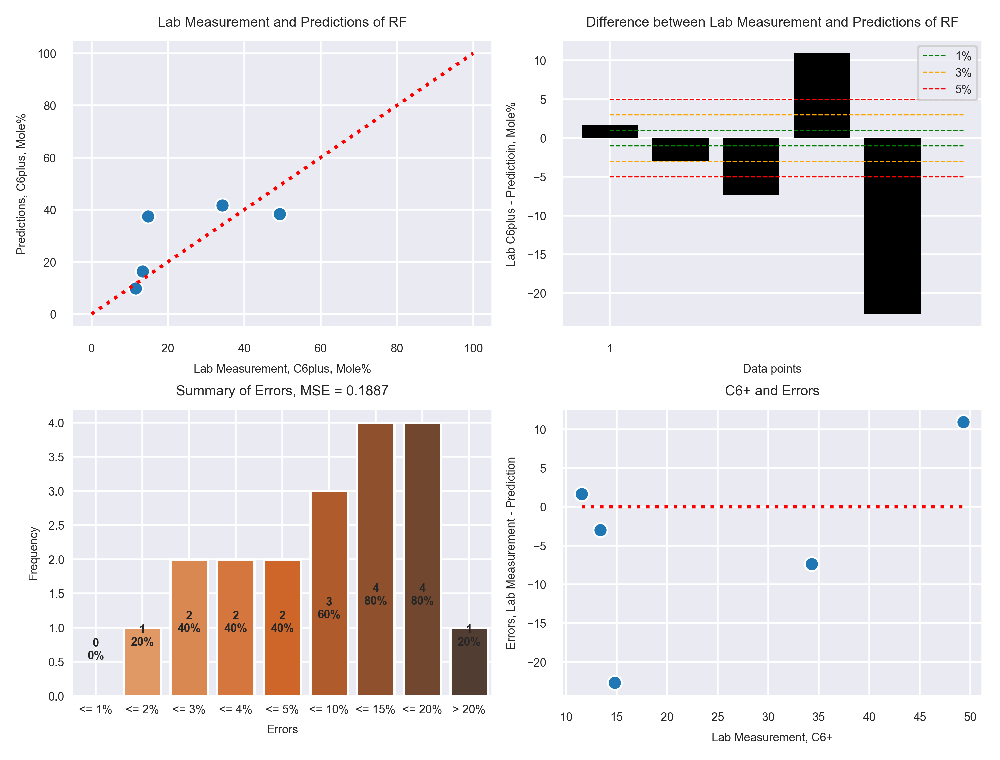

In [166]:
t2 = np.log1p(weighted_pre(X_test).Weighted_predictions)
plot_pred(t2, np.log1p(b), 'RF', mean_squared_error(t2, np.log1p(b)))

# 10. Workflow: C6+ to GOR

In [118]:
# Split
data_ind = total_y.GOR_scf_stb <10000
total_x_r2 = total_x_r[data_ind]
total_y2 = total_y[data_ind]

ind2 = (~total_y2.GOR_scf_stb.isnull())&(total_y2.GOR_scf_stb > 0)
total_y2 = total_y2[ind2]
total_x_r2 = total_x_r2[ind2]
X_train2, X_val2, y_train2, y_val2 = train_test_split(total_x_r2, total_y2, test_size = 0.2, random_state = 6265)
X_train2, X_val2 = np.log1p(X_train2), np.log1p(X_val2)

#Separate C6+ and GOR
# y_train_label, y_val_label = y_train['Labels'], y_val['Labels']
y_trainC6_2, y_valC6_2, y_train_GOR_2, y_val_GOR_2 = y_train2['C6plus_mol'], y_val2['C6plus_mol'], y_train2['GOR_scf_stb'], y_val2['GOR_scf_stb']
y_trainC6_log_2, y_valC6_log_2, y_train_GOR_log_2, y_val_GOR_log_2 = np.log1p(y_trainC6_2), np.log1p(y_valC6_2), np.log1p(y_train_GOR_2), np.log1p(y_val_GOR_2)

In [30]:
def joinC1andC6(X_train, y_train):
    return pd.concat((X_train.C1_mol, np.log1p(y_train.C6plus_mol)), axis = 1)

In [134]:
gor_xtrain = joinC1andC6(X_train2, y_train2)
gor_ytrain = y_train_GOR_log_2
gor_xval = joinC1andC6(X_val2, y_val2)
gor_yval = y_val_GOR_log_2

# test
gor_xtest = joinC1andC6(X_test2[(test_features2.GOR_SCF_STB > 0)&(test_features2.GOR_SCF_STB < 10000)], test_features2[(test_features2.GOR_SCF_STB > 0)&(test_features2.GOR_SCF_STB < 10000)])
gor_ytest = np.log1p(test_features2[(test_features2.GOR_SCF_STB > 0)&(test_features2.GOR_SCF_STB < 10000)].GOR_SCF_STB)

In [78]:
# gmm2 = GaussianMixture(n_components=2)
# lg = gmm2.fit_predict(pd.concat((total_y.C6plus_mol[~total_y.GOR_scf_stb.isnull()], np.log1p(total_y.GOR_scf_stb[~total_y.GOR_scf_stb.isnull()])), axis = 1))

In [120]:
# sns.scatterplot(total_y.C6plus_mol[~total_y.GOR_scf_stb.isnull()], np.log1p(total_y.GOR_scf_stb[~total_y.GOR_scf_stb.isnull()]), label = 'Training', linewidth = 0, s=2, hue=lg)

# sns.scatterplot(gor_xtest.C6plus_mol, (gor_ytest), label = 'Test', linewidth = 0, s=2, color = 'red')
# plt.legend().set_visible(False)
# plt.ylabel('GOR, Natural Log Transformed')
# plt.xlabel('C6plus, Mole%')
# # sns.scatterplot(x = [np.log1p(20.74)], y = [np.log1p(10500)], color = 'green')
# plt.grid()

In [121]:
# ## Tunning
# gpr_t = BaseModels(GaussianProcessRegressor, gor_xtrain, pd.DataFrame(y_train_GOR_log_2), gor_xval, pd.DataFrame(y_val_GOR_log_2), 5)
# g_par = {
#     'length': hp.uniform('length', 1e-10, 100),
#     'alpha': hp.uniform('alpha', 0,100)
#         }
# g_bp, _, trials = gpr_t.tuning(g_par, 100)
# g_bp['kernel'] = RBF(length_scale=g_bp['length'])
# g_bp.pop('length', None)

In [123]:
# data with GOR < 50000
# g_bp = {'alpha': 0.06294685246548651, 'kernel': RBF(length_scale=39.3)}
## data with GOR < 10000
g_bp = {'alpha': 0.11375083599030134, 'kernel': RBF(length_scale=12.9)}
# all data 
#g_bp = {'alpha': 0.06990939319645255, 'kernel': RBF(length_scale=38.7)}
gpr = GaussianProcessRegressor(**g_bp).fit(gor_xtrain, gor_ytrain)

In [124]:
# C6+ predition of validation dataset
val_C6_pred = np.log1p(weighted_pre(X_val2).Weighted_predictions)

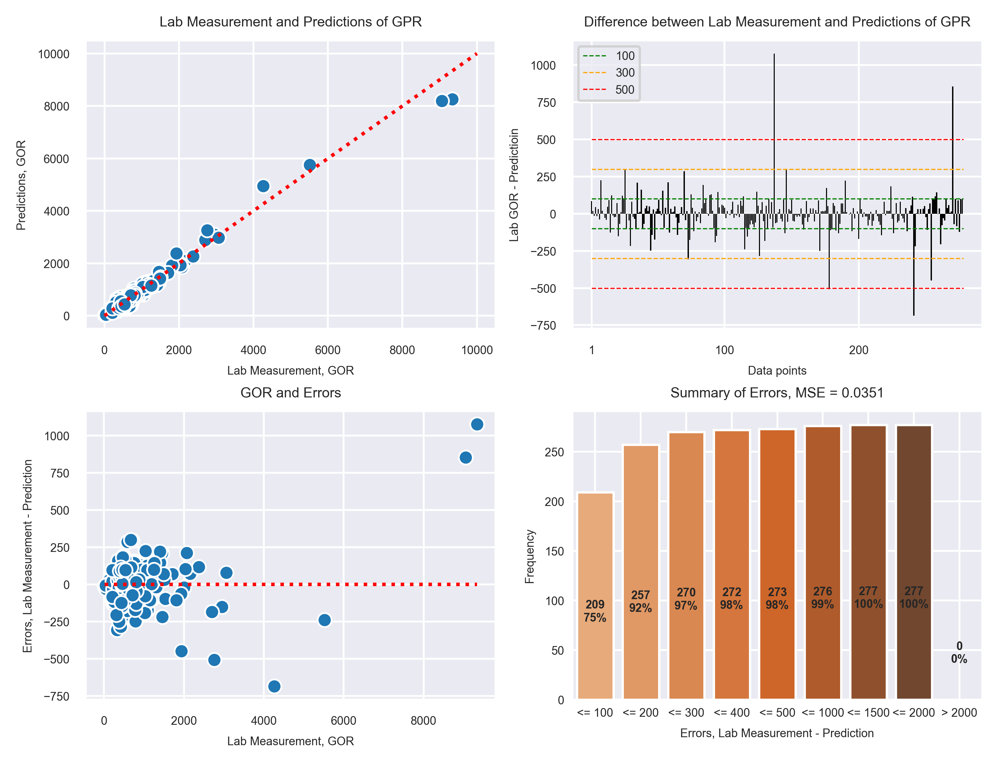

In [131]:
# validation
val_pred, sig1 = gpr.predict(gor_xval, return_std=True)
plot_pred2(val_pred, gor_yval, 'GPR', mean_squared_error(val_pred, gor_yval), 10000)

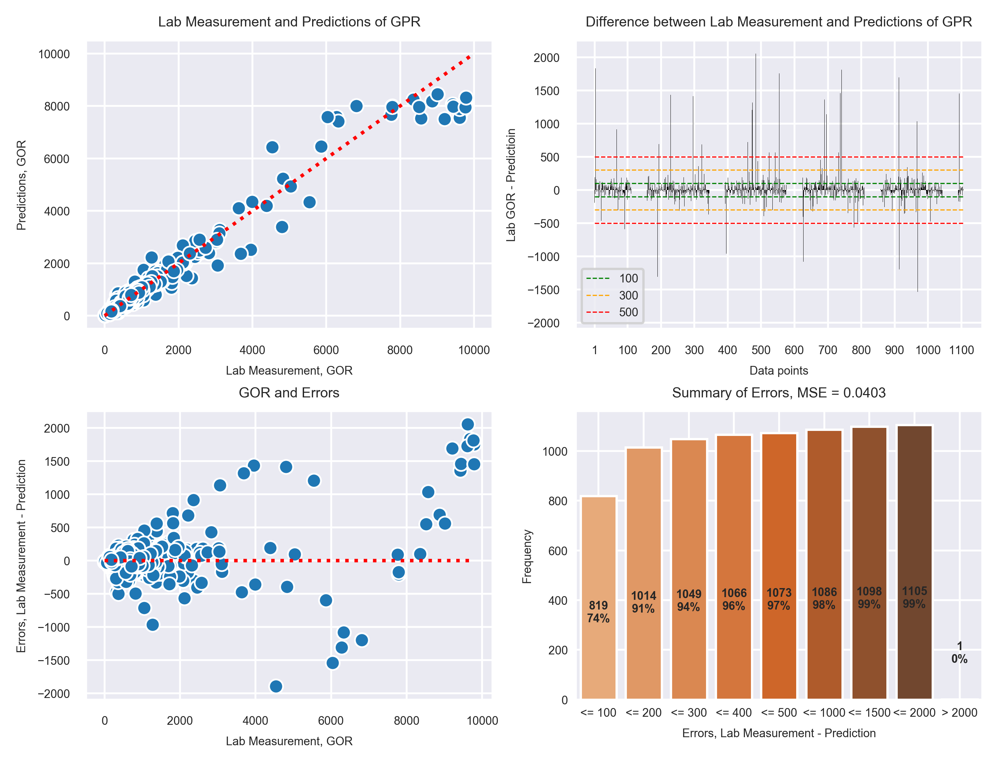

In [126]:
# training
train_pred = gpr.predict(gor_xtrain)
plot_pred2(train_pred, gor_ytrain, 'GPR', mean_squared_error(train_pred, gor_ytrain), 10000)

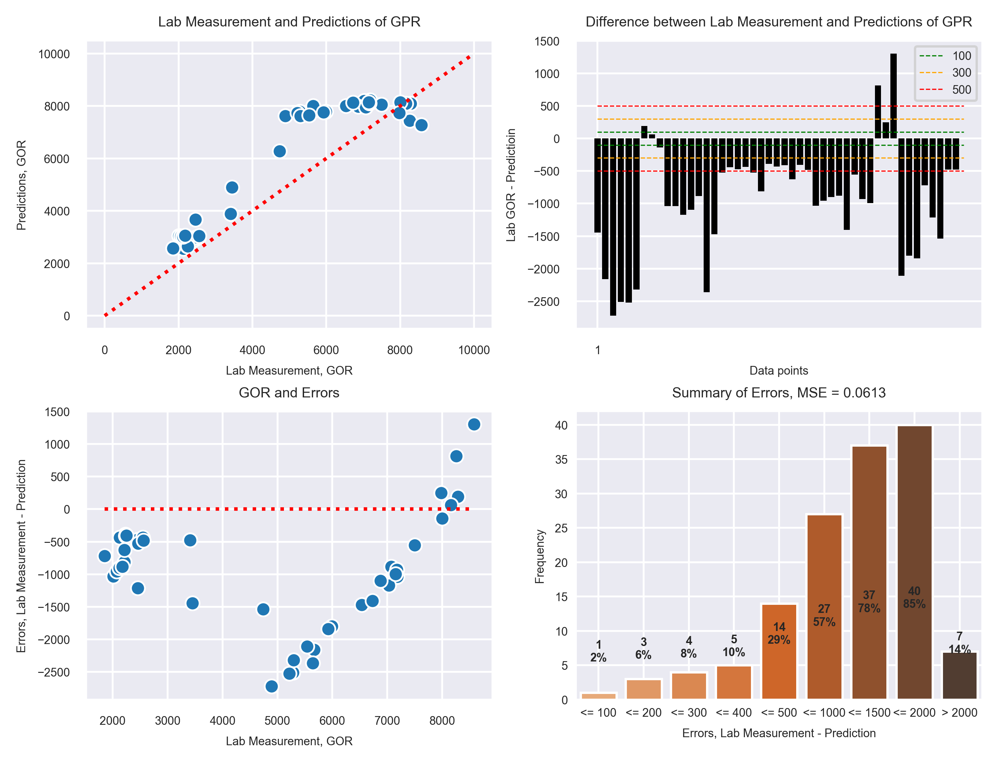

In [135]:

# Test
test_pred = gpr.predict(gor_xtest)
plot_pred2(test_pred, gor_ytest, 'GPR', mean_squared_error(test_pred, gor_ytest), 10000)

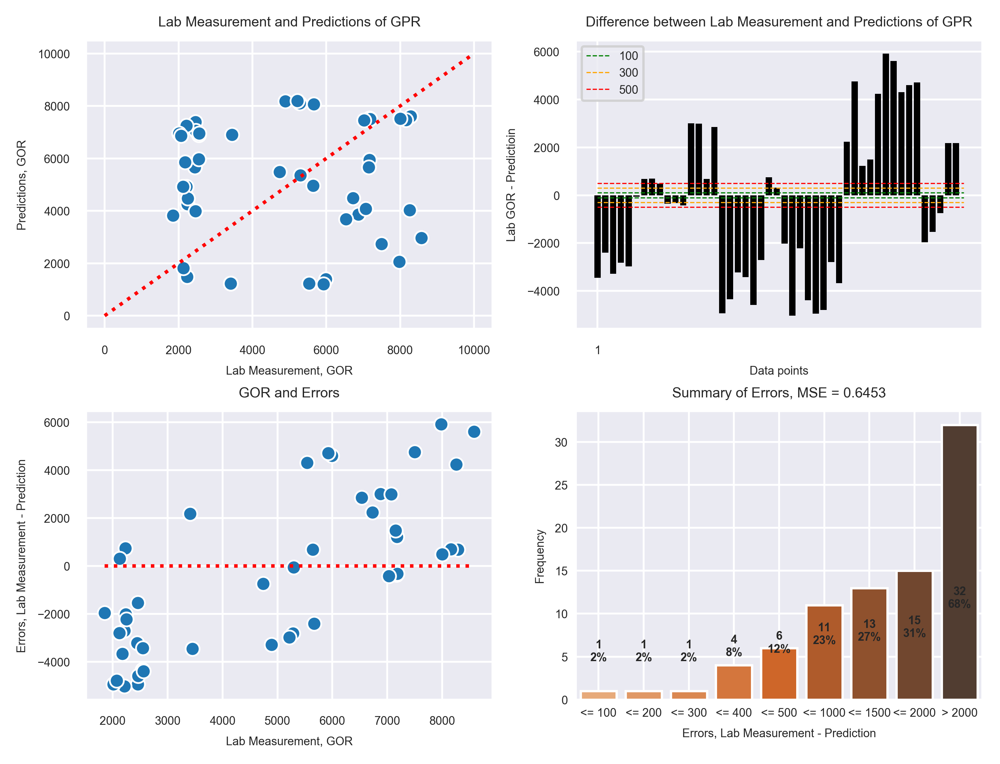

In [137]:
# test2, with predicted C6+
pred_c6_2 = np.log1p(weighted_pre(X_test2[(test_features2.GOR_SCF_STB > 0)&(test_features2.GOR_SCF_STB < 10000)])[['Weighted_predictions']])

gor_xtest2 = pd.concat((X_test2[(test_features2.GOR_SCF_STB > 0)&(test_features2.GOR_SCF_STB < 10000)].C1_mol, pred_c6_2), axis = 1)
gor_ytest2 = np.log1p(test_features2[(test_features2.GOR_SCF_STB > 0)&(test_features2.GOR_SCF_STB < 10000)].GOR_SCF_STB)

test_pred2, sig2 = gpr.predict(gor_xtest2, return_std=True)
plot_pred2(test_pred2, gor_ytest2, 'GPR', mean_squared_error(test_pred2, gor_ytest2),10000)

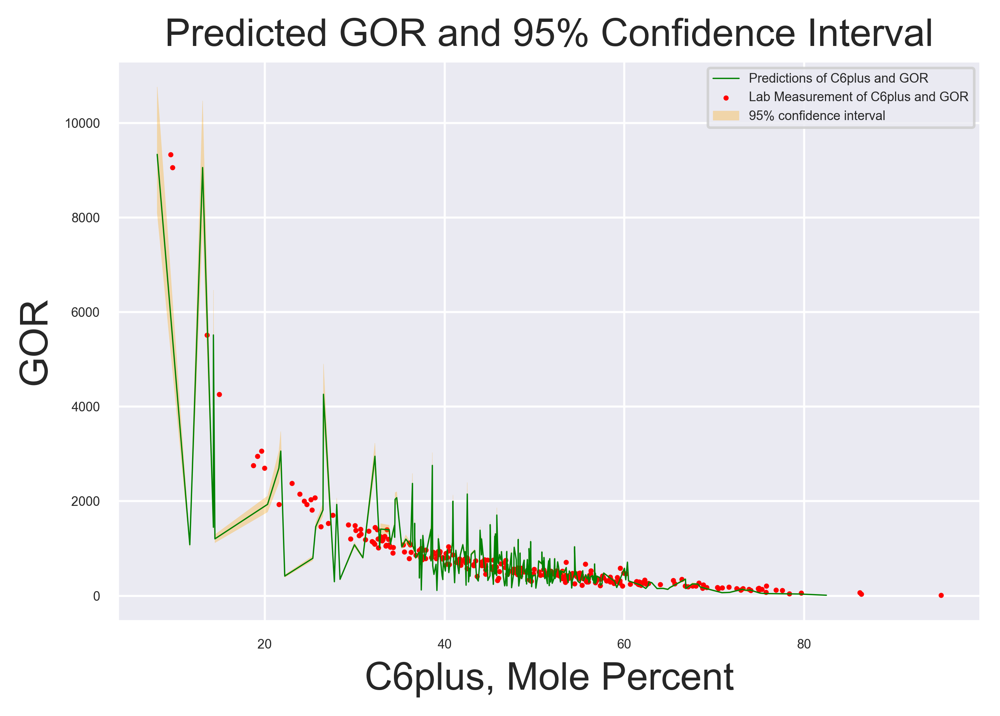

In [138]:
# CI of validation set
plotGORCI(y_valC6_log_2, y_val_GOR_log_2, val_C6_pred, (gor_yval), sig1, raw_x = True, raw_y=True)
# plt.ylim([-10, 1000])

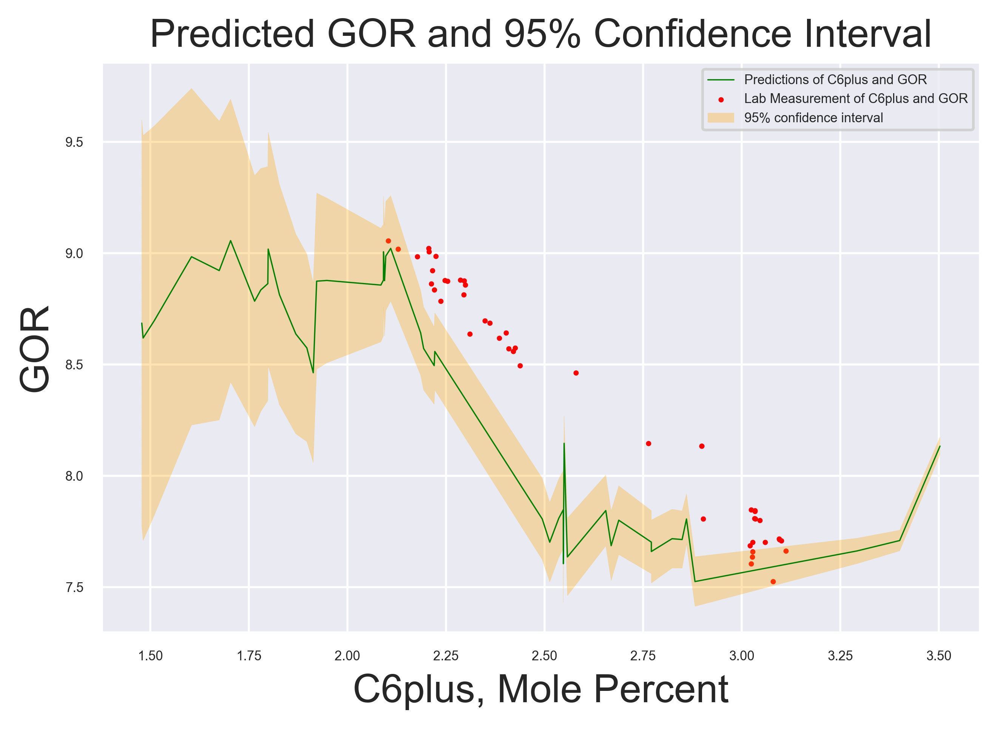

In [139]:
# CI of test set
plotGORCI(gor_xtest.C6plus_mol.values.ravel(), gor_ytest2.values.ravel(), pred_c6_2.values.ravel(), gor_ytest2.values.ravel(), sig2, raw_x = False, raw_y=False)

In [67]:
def plotGORCI(y_valC6_log, y_val_GOR_log, pred, gpr_pred, sigma, raw_x = None, raw_y = None):
    index = np.argsort(pred)
    index2 = np.argsort(y_valC6_log)
    
    if raw_x == True:
        x_pred = np.expm1(pred)
        x_true = np.expm1(y_valC6_log)
    else:
        x_pred = pred
        x_true = y_valC6_log
        
    if raw_y == True:
        y_true = np.expm1(y_val_GOR_log)
        y_pred = np.expm1(gpr_pred)
        y1 = np.expm1(gpr_pred.ravel() - 1.9600 * sigma)[index]
        y2 = np.expm1(gpr_pred.ravel() + 1.9600 * sigma)[index]
    else:
        y_true = y_val_GOR_log
        y_pred = gpr_pred
        y1 = (gpr_pred.ravel() - 1.9600 * sigma)[index]
        y2 = (gpr_pred.ravel() + 1.9600 * sigma)[index]

    plt.plot(sorted(x_pred), y_pred.ravel()[index], label = 'Predictions of C6plus and GOR', color = 'green', lw = 0.5)
    plt.scatter(sorted(x_true), y_true.ravel()[index2], label = 'Lab Measurement of C6plus and GOR', color = 'red', s = 1)
    plt.fill_between(sorted(x_pred), y1, y2, alpha=.3, color = 'orange', label='95% confidence interval', linestyle = '--', lw = 0.1)
    plt.title('Predicted GOR and 95% Confidence Interval', fontsize = 15)
    plt.xlabel('C6plus, Mole Percent', fontsize = 15)
    plt.ylabel('GOR', fontsize = 15)
    plt.legend()
    plt.grid()
#     plt.show()

# Some further analysis

In [273]:
test_m = test_features2[test_features2.GOR_SCF_STB >0].drop('Fluid_Type', axis = 1)
test_m2 = test_m.drop('GOR_SCF_STB', axis = 1)
test_m2.head()

,C1_mol,C2_mol,C3_mol,C4_mol,C5_mol,C6plus_mol
0,62.880,8.030,5.960,3.840,2.110,14.860
3,69.300,9.015,4.474,2.636,1.637,10.047
4,68.886,8.998,4.483,2.636,1.643,10.449
5,69.163,9.007,4.505,2.655,1.635,10.126
6,68.924,9.048,4.540,2.685,1.661,10.249


In [280]:
com_m = training_features.loc[training_features.GOR_scf_stb>0, ['C1_mol', 'C2_mol', 'C3_mol', 'C4_mol', 'C5_mol', 'C6plus_mol']]
com_m.head()

,C1_mol,C2_mol,C3_mol,C4_mol,C5_mol,C6plus_mol
0,0.908000,0.128,0.534121,1.585999,2.373999,93.999954
1,0.008000,0.042,0.520118,3.717998,4.941997,90.475953
2,1.140001,0.144,0.386088,1.012001,1.526001,95.190051
3,1.002000,0.160,0.640145,1.826000,2.470001,93.328020
4,1.174001,0.174,0.688156,1.850001,2.384001,92.900058


In [287]:
cor_dict = {}
for i in range(test_m2.shape[0]):
    if (i+1)%10 == 0:
        print(i)
    min_d = +np.inf
    for j in range(com_m.shape[0]):
        temp_d = d.cityblock(test_m2.iloc[i,:], com_m.iloc[j,:])
        if temp_d < min_d:
            min_d = temp_d
            cor_dict[test_m2.index[i]] = j

9
19
29
39
49


In [298]:
ind_list = [cor_dict[i] for i in cor_dict.keys()]
result_m = pd.concat((test_features2.iloc[test_m2.index].reset_index(drop = True), training_features.iloc[ind_list].reset_index(drop = True)), axis = 1)

In [300]:
result_m.to_csv('C:/YujianWu/Data/AMG/20190508WeightedPredictions/Manhattan.csv', index=0)